In [1]:
import torch
from torch import nn
from torchvision.transforms import ToTensor
from torchvision.datasets import MNIST
from torch.utils.data import DataLoader
from torch.optim import Adam
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
torch.manual_seed(0)

### Parameters

In [2]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
noise_dim = 64
z_dim = 64

display_step = 500
batch_size = 128
img_dim = 28 * 28
hidden_dim = 128
lr = 0.00001
device = "cpu"

### Load Dataset

In [3]:
dataloader = DataLoader(MNIST("./data", download=True, transform=ToTensor()), batch_size=batch_size, shuffle=True)

### Noise Function

In [4]:
def get_noise(n_samples, noise_dim, device="cpu"):
    return torch.randn(n_samples, noise_dim, device=device)

### Utility function

In [5]:
def show_tensor_images(image_tensors, num_images=25, size=(1, 28, 28)):
    image_unflat = image_tensors.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

# Generator 

In [6]:
def get_generator_layer(input_dim, output_dim):
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True)
    )

In [7]:
class Generator(nn.Module):
    def __init__(self, noise_dim, img_dim=28 * 28, hidden_dim=128):
        super().__init__()
        self.gen = nn.Sequential(
            get_generator_layer(noise_dim, hidden_dim),
            get_generator_layer(hidden_dim, 2 * hidden_dim),
            get_generator_layer(2 * hidden_dim, 4 * hidden_dim),
            get_generator_layer(4 * hidden_dim, 8 * hidden_dim),
            nn.Linear(8 * hidden_dim, img_dim),
            nn.Sigmoid()
        )
    
    def forward(self, noise):
        return self.gen(noise)
    
    def get_gen(self):
         return self.gen

# Discriminator

In [8]:
def get_discriminator_layer(input_dim, output_dim):
     return nn.Sequential(
         nn.Linear(input_dim, output_dim),
         nn.LeakyReLU(0.2, inplace=True),
     )

In [9]:
class Discriminator(nn.Module):
    def __init__(self, img_dim=28 * 28, hidden_dim=128):
        super().__init__()
        self.disc = nn.Sequential(
            get_discriminator_layer(img_dim, 4 * hidden_dim),
            get_discriminator_layer(4 * hidden_dim, 2 * hidden_dim),
            get_discriminator_layer(2 * hidden_dim, hidden_dim),
            nn.Linear(hidden_dim, 1),
        )
    
    def forward(self, generated_img):
        return self.disc(generated_img)

# Training

In [10]:
gen = Generator(noise_dim, img_dim, hidden_dim)
gen_opt = Adam(gen.parameters(), lr=lr)

In [11]:
disc = Discriminator(img_dim, hidden_dim)
disc_opt = Adam(disc.parameters(), lr=lr)

In [12]:
def get_disc_loss(gen, disc, criterion, real, num_images, noise_dim, device):
    noise = get_noise(num_images, noise_dim, device=device)
    fake = gen(noise)
    
    fake_pred = disc(fake.detach())
    fake_loss = criterion(fake_pred, torch.zeros_like(fake_pred))
    
    real_pred = disc(real)
    real_loss = criterion(real_pred, torch.ones_like(real_pred))
    
    disc_loss = (fake_loss + real_loss) / 2
    return disc_loss
    
    
    
def get_gen_loss(gen, disc, criterion, num_images, noise_dim, device):
    noise = get_noise(num_images, noise_dim, device=device)
    fake = gen(noise)
    
    real_pred = disc(fake)
    real_loss = criterion(real_pred, torch.ones_like(real_pred))
    
    return real_loss

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

step 500: gen loss: 1.3898597209453583, disc loss: 0.41951206654310186


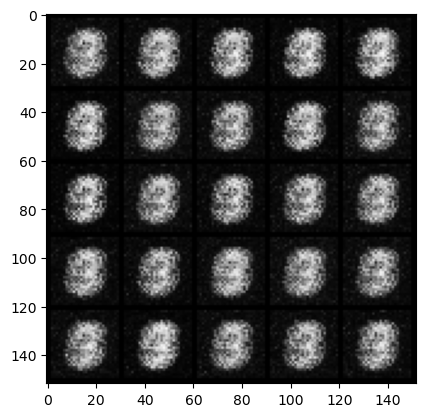

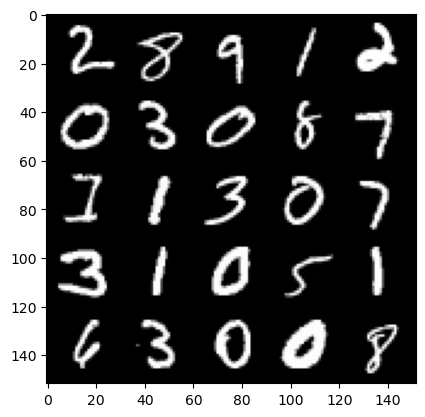

  0%|          | 0/469 [00:00<?, ?it/s]

step 1000: gen loss: 1.6753324806690235, disc loss: 0.2989561563730239


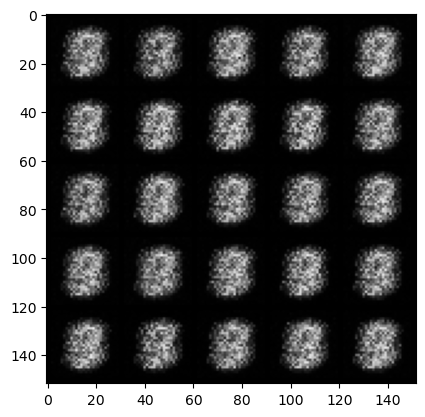

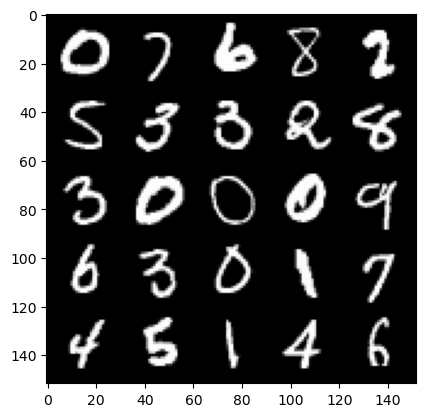

  0%|          | 0/469 [00:00<?, ?it/s]

step 1500: gen loss: 1.9661580288410188, disc loss: 0.1732419795393945


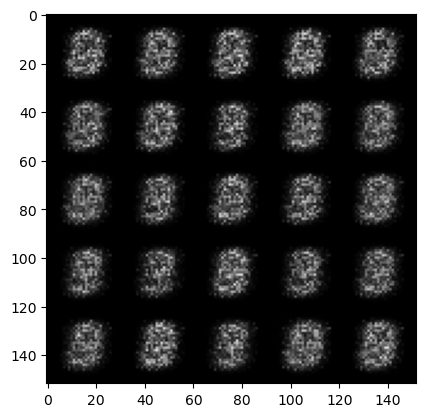

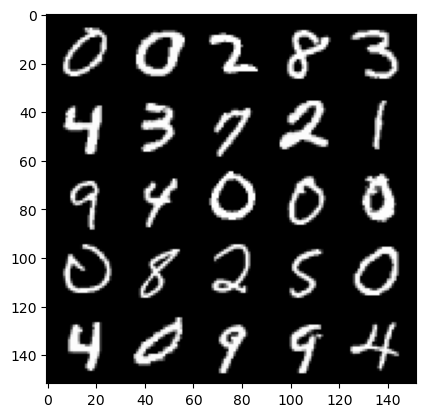

  0%|          | 0/469 [00:00<?, ?it/s]

step 2000: gen loss: 1.7944383838176732, disc loss: 0.19056548401713364


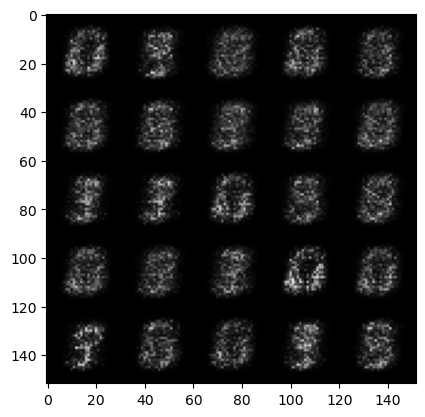

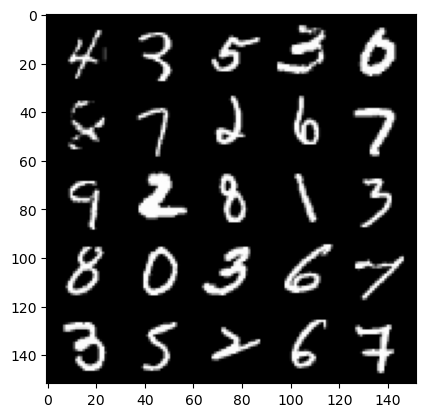

  0%|          | 0/469 [00:00<?, ?it/s]

step 2500: gen loss: 1.7332223083972946, disc loss: 0.19460677817463864


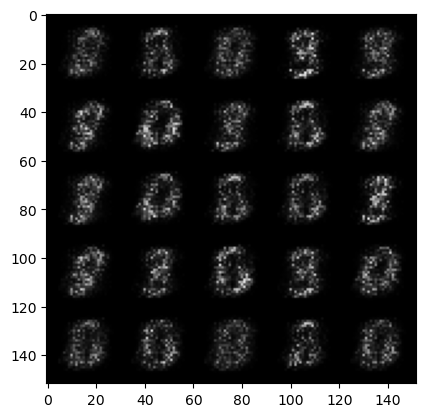

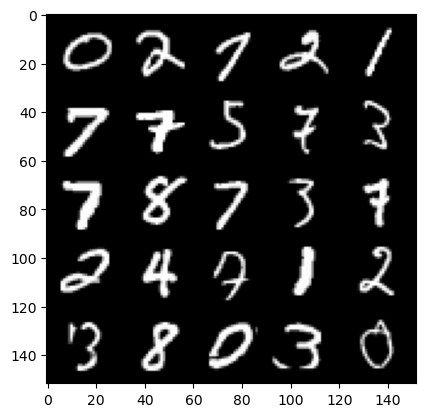

  0%|          | 0/469 [00:00<?, ?it/s]

step 3000: gen loss: 2.032766095399857, disc loss: 0.14599696493148784


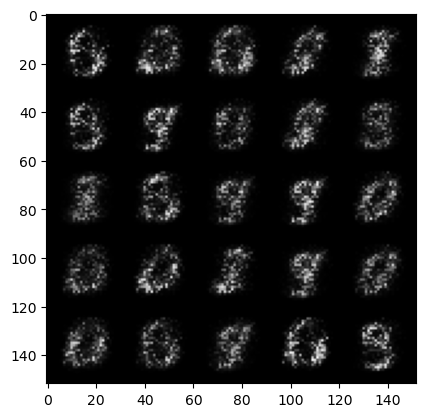

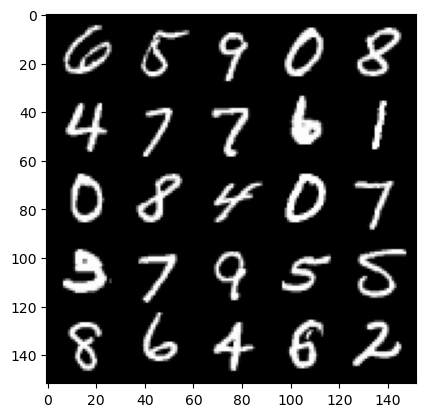

  0%|          | 0/469 [00:00<?, ?it/s]

step 3500: gen loss: 2.4571046414375295, disc loss: 0.12266066384315484


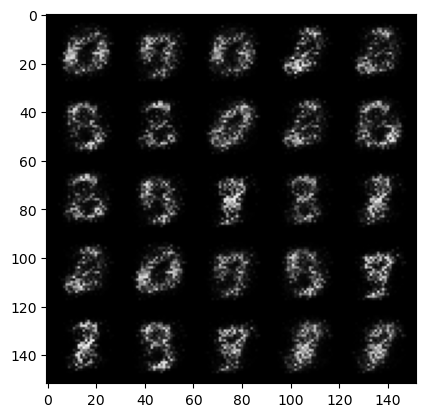

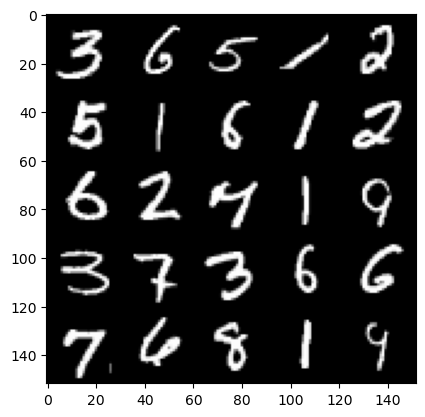

  0%|          | 0/469 [00:00<?, ?it/s]

step 4000: gen loss: 2.727115097045896, disc loss: 0.116345483765006


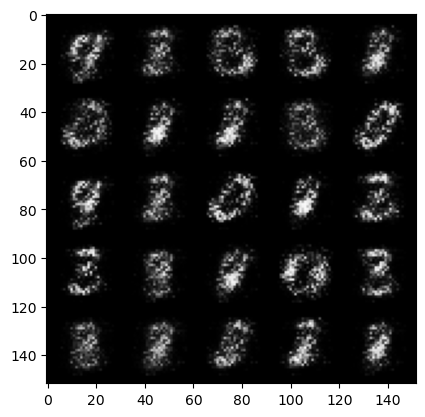

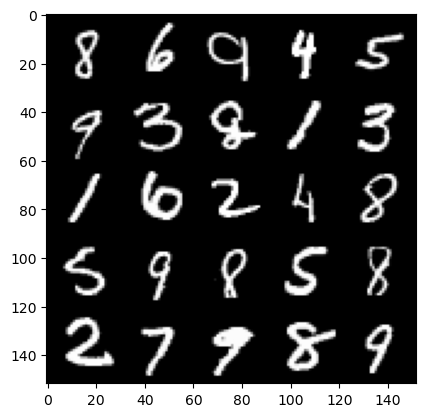

  0%|          | 0/469 [00:00<?, ?it/s]

step 4500: gen loss: 3.1591912388801546, disc loss: 0.10825706279277801


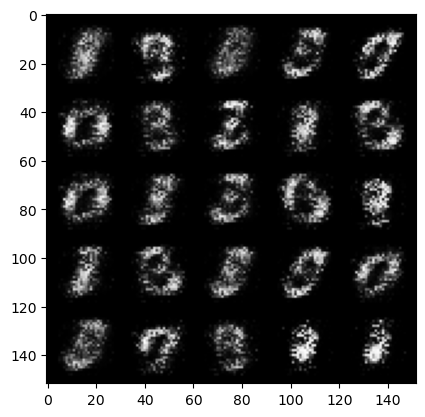

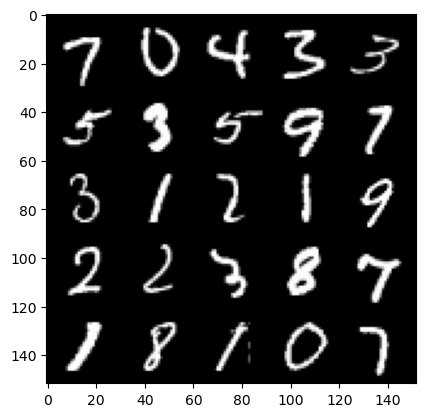

  0%|          | 0/469 [00:00<?, ?it/s]

step 5000: gen loss: 3.2214653401374806, disc loss: 0.08929792847484352


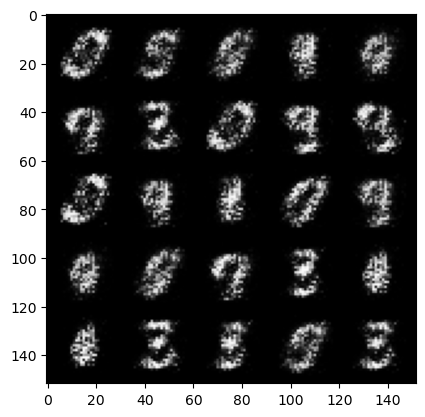

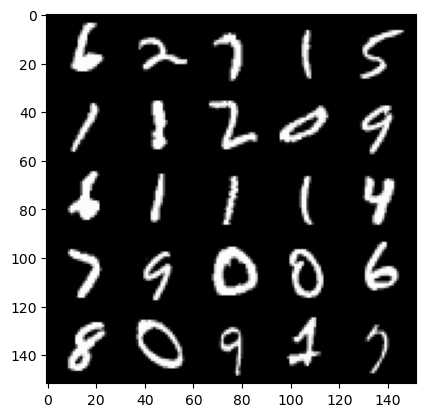

  0%|          | 0/469 [00:00<?, ?it/s]

step 5500: gen loss: 3.52348350286484, disc loss: 0.08232414730638264


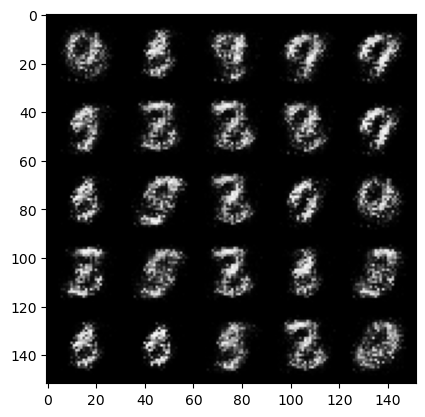

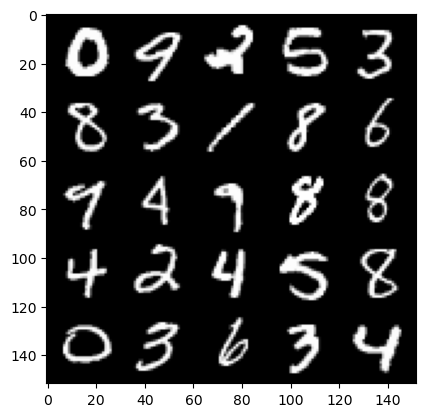

  0%|          | 0/469 [00:00<?, ?it/s]

step 6000: gen loss: 3.5849335594177236, disc loss: 0.0824659416675568


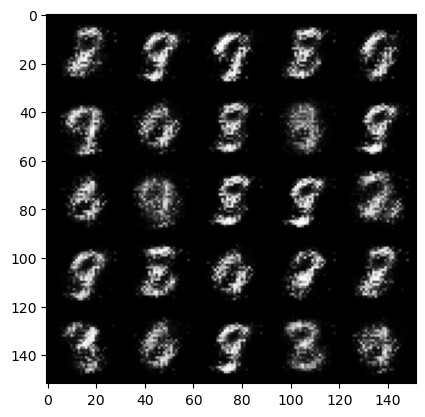

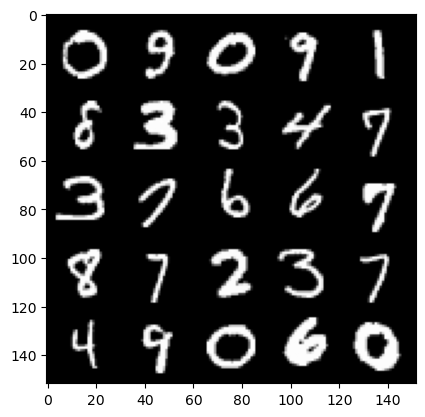

  0%|          | 0/469 [00:00<?, ?it/s]

step 6500: gen loss: 3.7113019418716426, disc loss: 0.06749983096122746


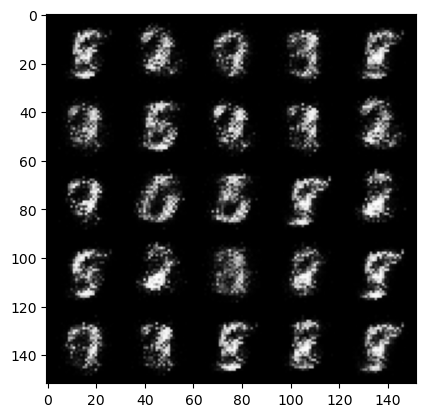

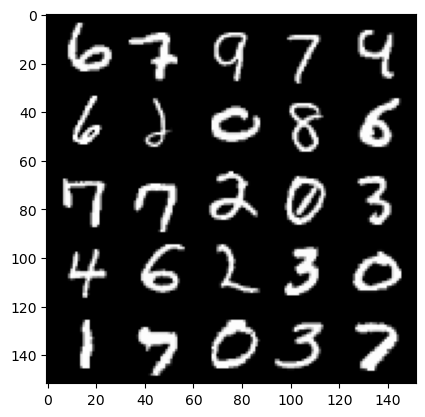

  0%|          | 0/469 [00:00<?, ?it/s]

step 7000: gen loss: 3.901026535511015, disc loss: 0.05518460158631209


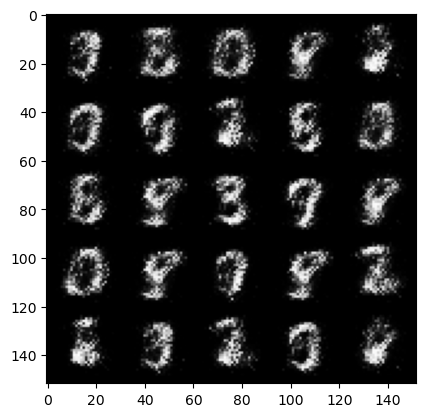

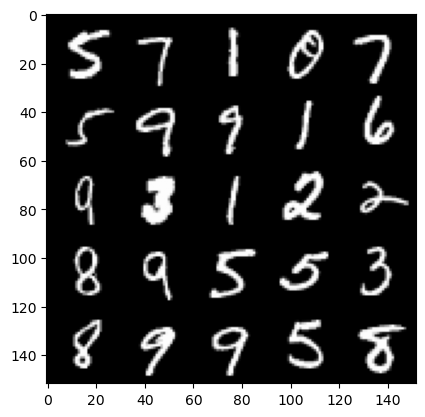

  0%|          | 0/469 [00:00<?, ?it/s]

step 7500: gen loss: 3.9584695401191743, disc loss: 0.06724535600841049


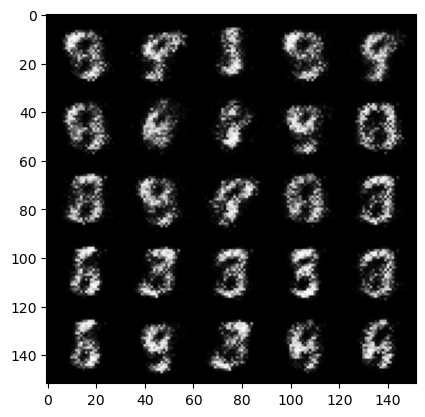

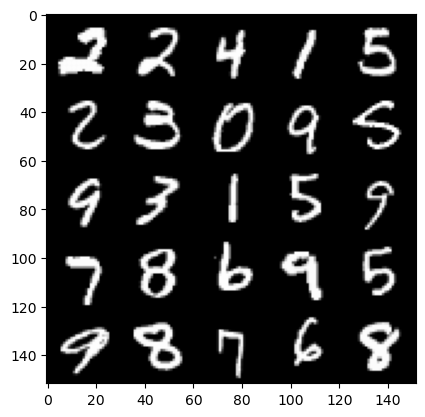

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

step 8000: gen loss: 3.8416062731742833, disc loss: 0.07483228021115067


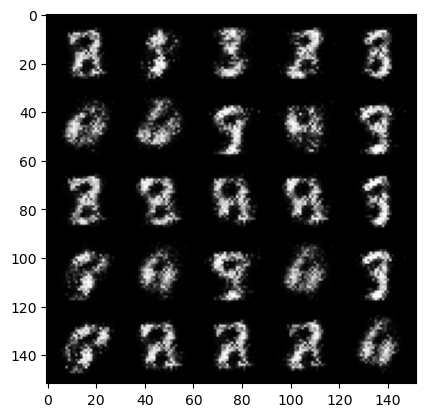

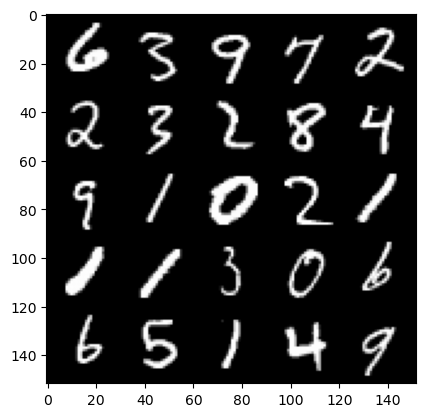

  0%|          | 0/469 [00:00<?, ?it/s]

step 8500: gen loss: 3.8309033284187324, disc loss: 0.06602318017184741


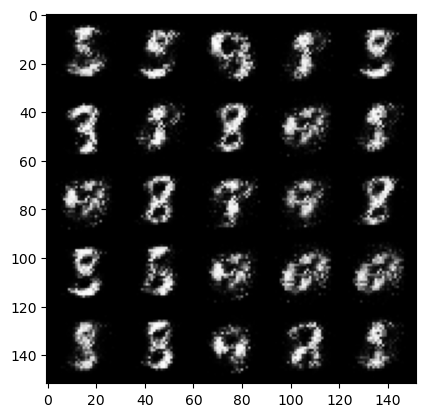

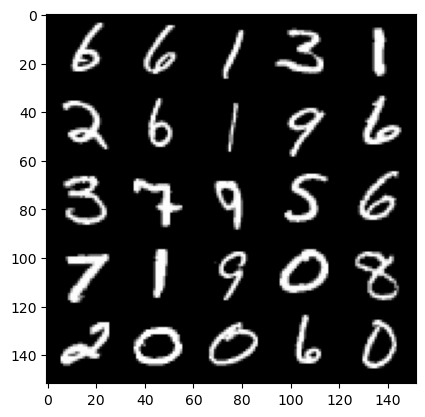

  0%|          | 0/469 [00:00<?, ?it/s]

step 9000: gen loss: 3.888736245632173, disc loss: 0.06366247419267891


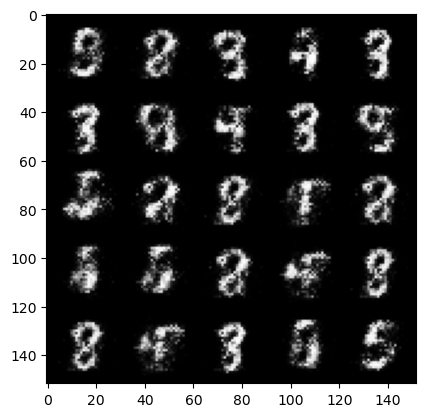

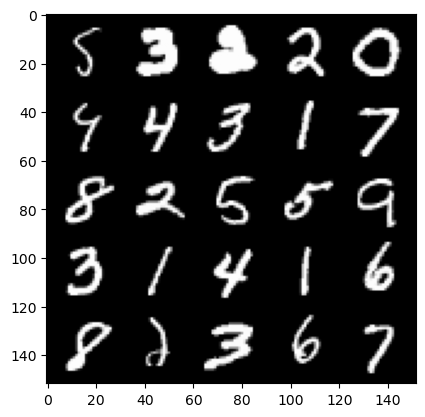

  0%|          | 0/469 [00:00<?, ?it/s]

step 9500: gen loss: 3.8260502414703383, disc loss: 0.06754026372730736


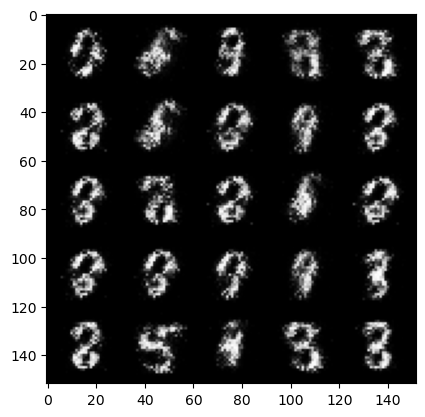

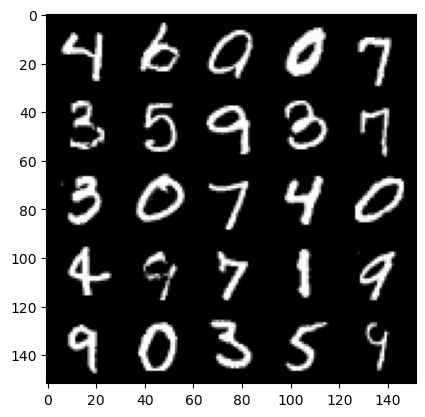

  0%|          | 0/469 [00:00<?, ?it/s]

step 10000: gen loss: 3.739020805835725, disc loss: 0.0693443791344762


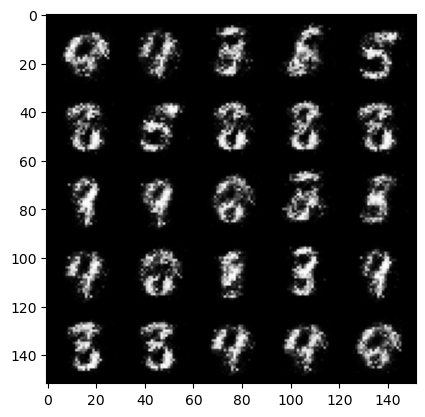

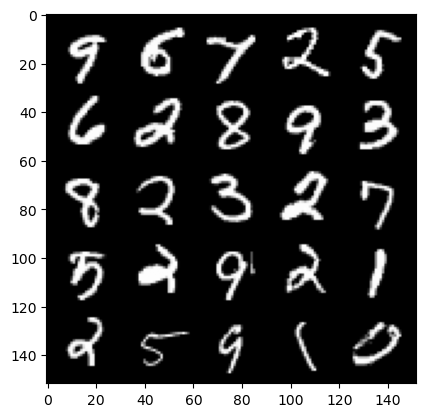

  0%|          | 0/469 [00:00<?, ?it/s]

step 10500: gen loss: 3.809771309852598, disc loss: 0.06979912239313127


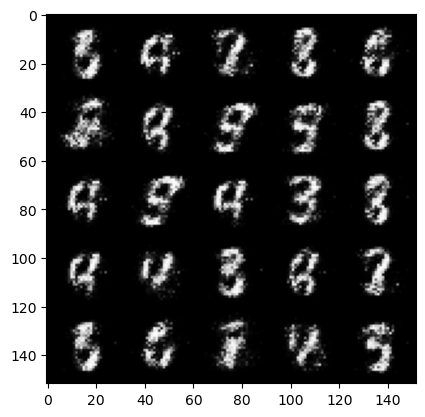

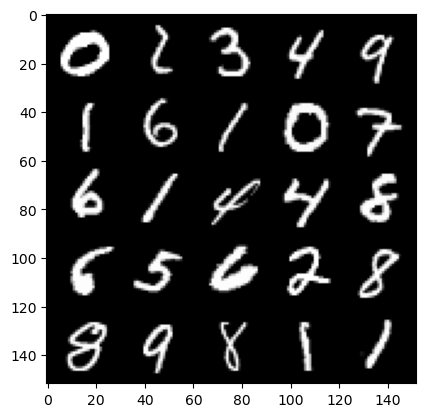

  0%|          | 0/469 [00:00<?, ?it/s]

step 11000: gen loss: 3.8517348475456226, disc loss: 0.06441387140378352


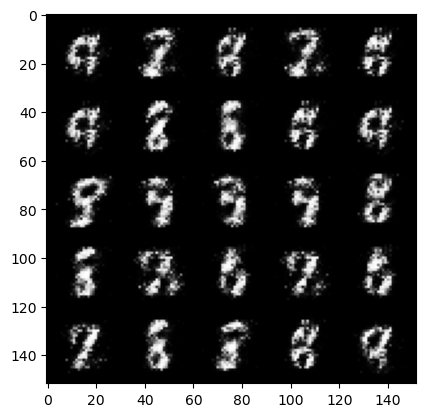

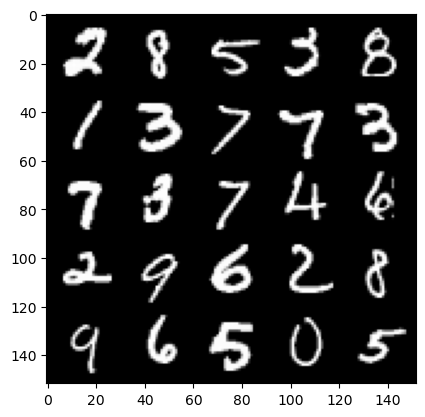

  0%|          | 0/469 [00:00<?, ?it/s]

step 11500: gen loss: 4.148082058429716, disc loss: 0.05590277943760156


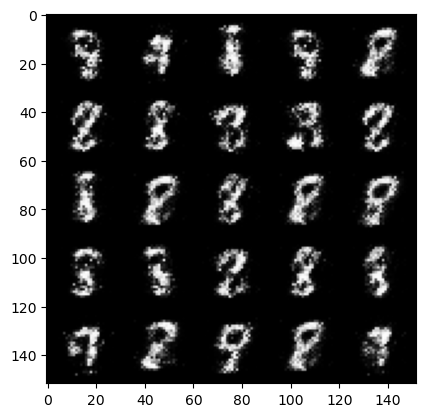

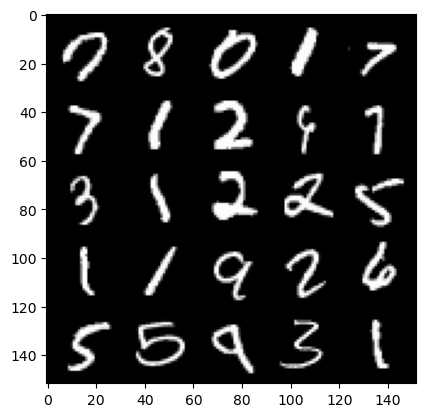

  0%|          | 0/469 [00:00<?, ?it/s]

step 12000: gen loss: 3.863048928737642, disc loss: 0.07231225962936878


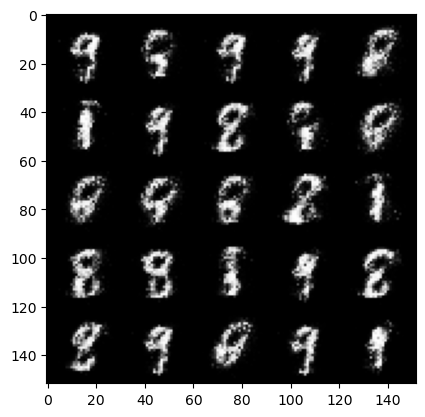

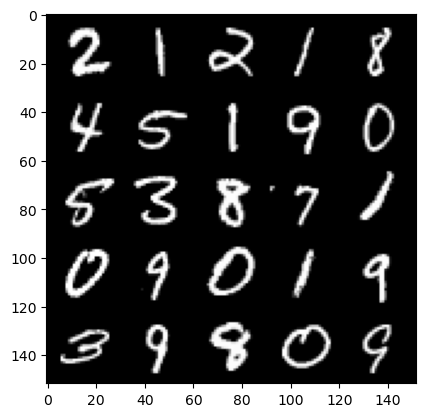

  0%|          | 0/469 [00:00<?, ?it/s]

step 12500: gen loss: 4.005266079425813, disc loss: 0.06891764484345912


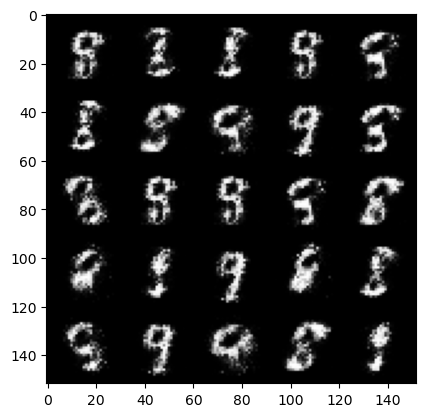

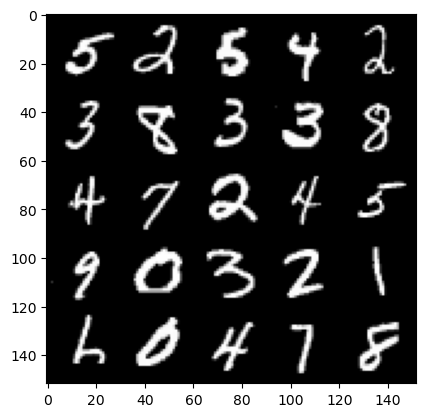

  0%|          | 0/469 [00:00<?, ?it/s]

step 13000: gen loss: 3.7376509375572238, disc loss: 0.08321193323284393


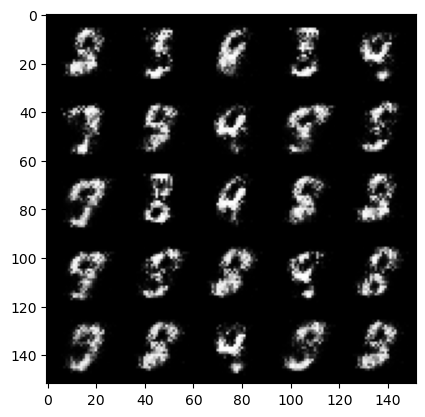

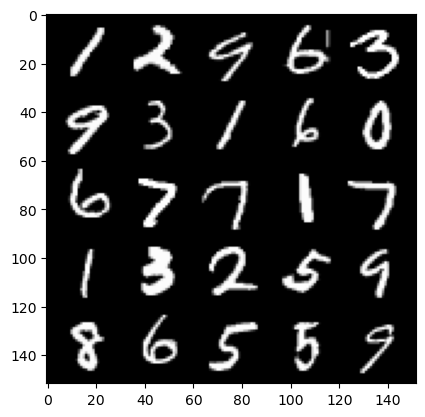

  0%|          | 0/469 [00:00<?, ?it/s]

step 13500: gen loss: 3.9045161957740793, disc loss: 0.07940657890588054


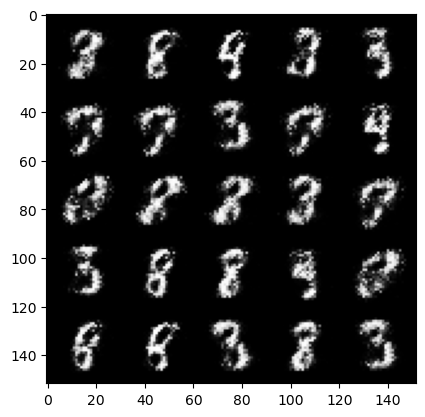

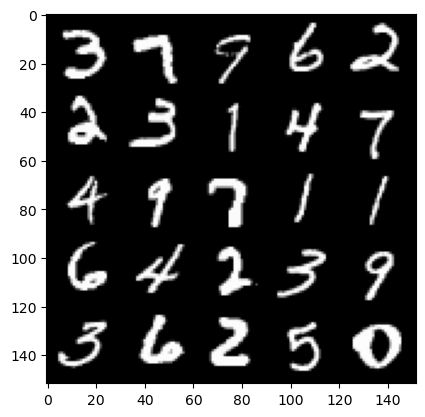

  0%|          | 0/469 [00:00<?, ?it/s]

step 14000: gen loss: 3.7791086463928227, disc loss: 0.08654602126032107


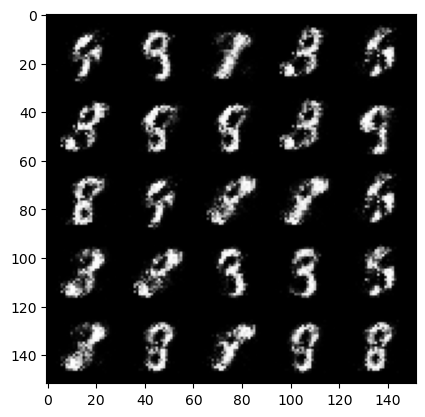

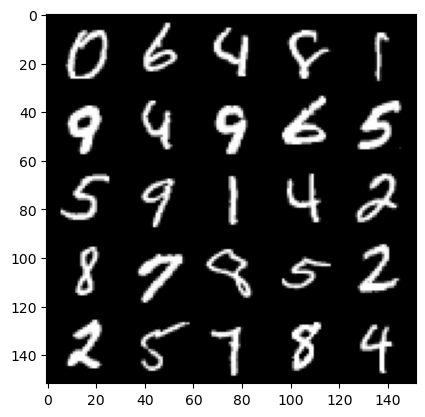

  0%|          | 0/469 [00:00<?, ?it/s]

step 14500: gen loss: 3.8206914143562325, disc loss: 0.08526175349950799


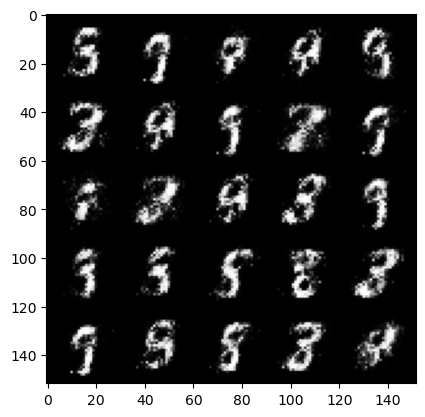

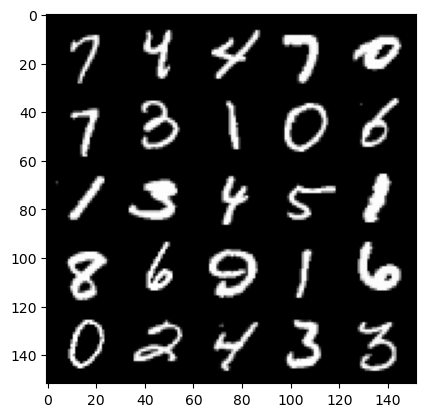

  0%|          | 0/469 [00:00<?, ?it/s]

step 15000: gen loss: 3.84000636291504, disc loss: 0.09324069248884911


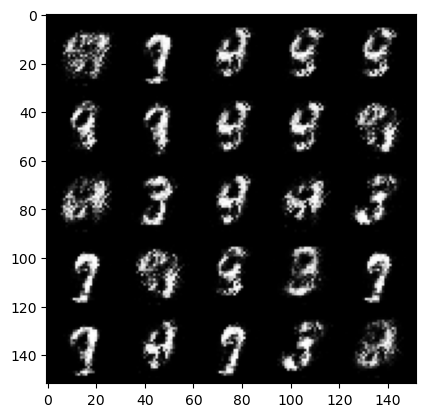

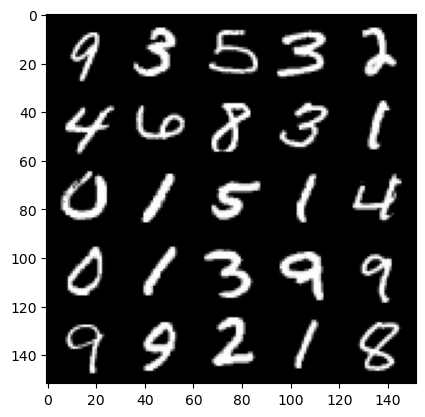

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

step 15500: gen loss: 3.741849330902099, disc loss: 0.09427698209881775


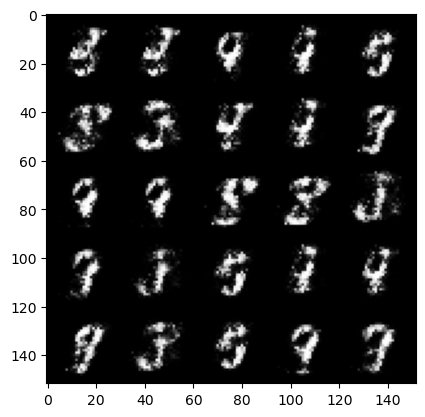

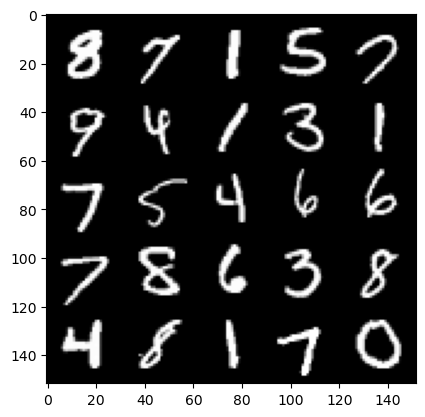

  0%|          | 0/469 [00:00<?, ?it/s]

step 16000: gen loss: 3.772096994876863, disc loss: 0.09013207667320981


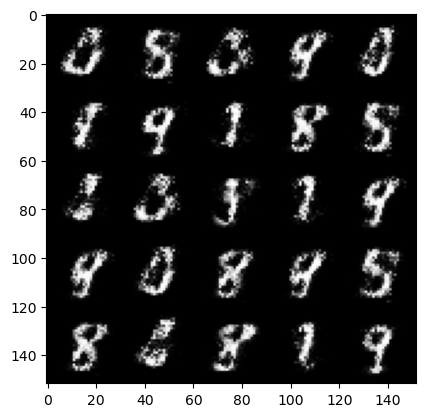

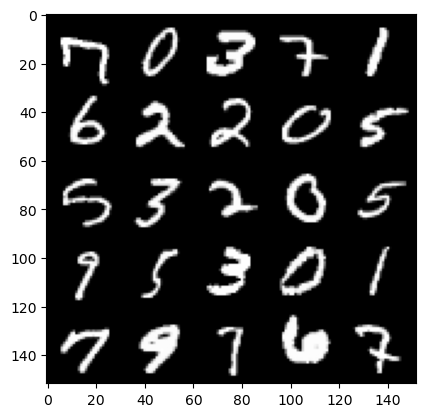

  0%|          | 0/469 [00:00<?, ?it/s]

step 16500: gen loss: 3.8617296533584593, disc loss: 0.08303654536604882


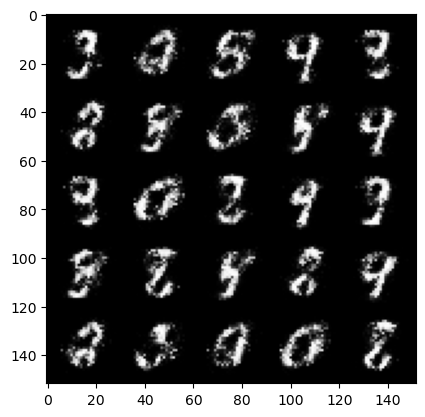

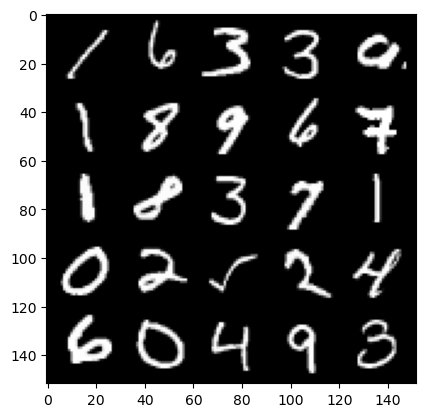

  0%|          | 0/469 [00:00<?, ?it/s]

step 17000: gen loss: 3.8651561903953557, disc loss: 0.09705536954849954


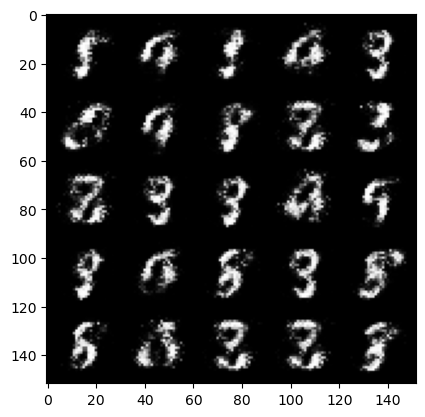

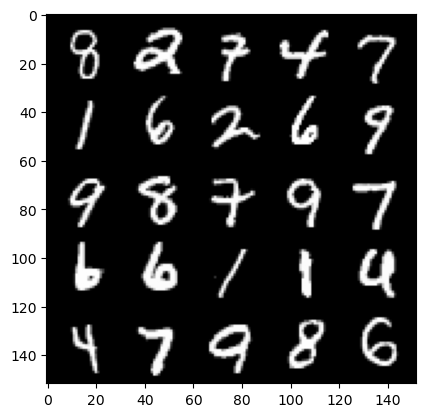

  0%|          | 0/469 [00:00<?, ?it/s]

step 17500: gen loss: 4.045931873321534, disc loss: 0.09392675806581972


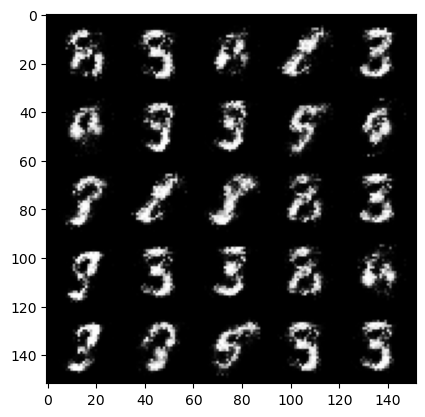

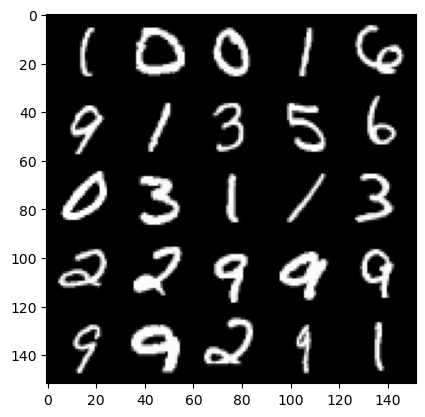

  0%|          | 0/469 [00:00<?, ?it/s]

step 18000: gen loss: 3.879891345500949, disc loss: 0.10310666447132814


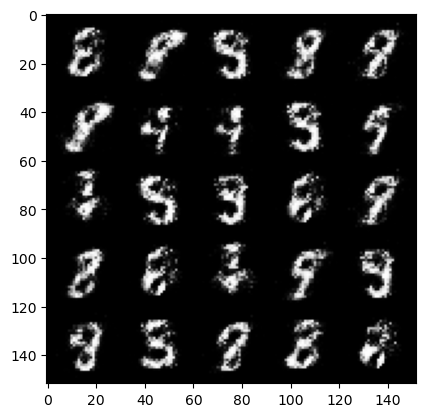

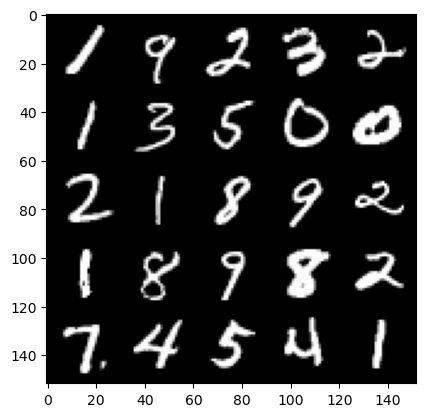

  0%|          | 0/469 [00:00<?, ?it/s]

step 18500: gen loss: 3.843230230808256, disc loss: 0.11070127537101505


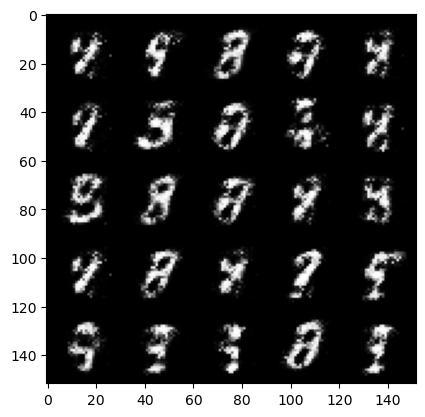

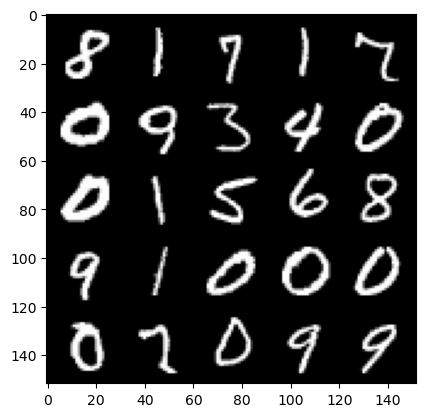

  0%|          | 0/469 [00:00<?, ?it/s]

step 19000: gen loss: 3.833068417072296, disc loss: 0.11094847967475645


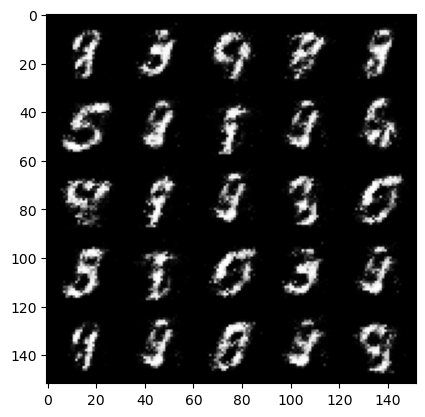

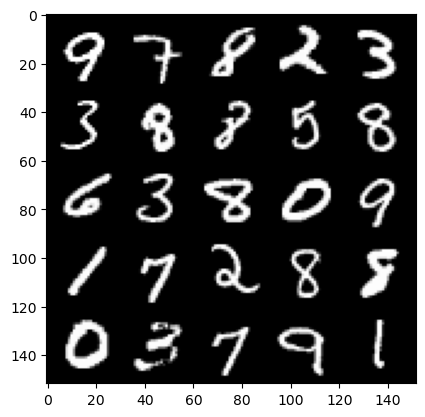

  0%|          | 0/469 [00:00<?, ?it/s]

step 19500: gen loss: 3.787734345912934, disc loss: 0.11317679709941139


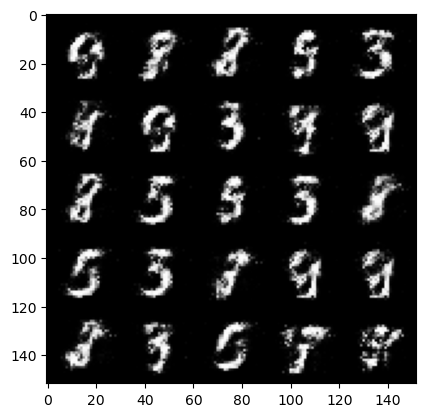

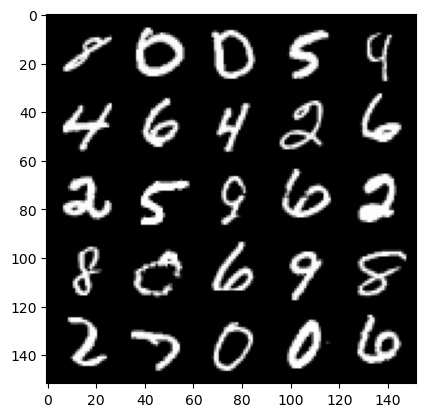

  0%|          | 0/469 [00:00<?, ?it/s]

step 20000: gen loss: 3.739000706195834, disc loss: 0.11199063559621568


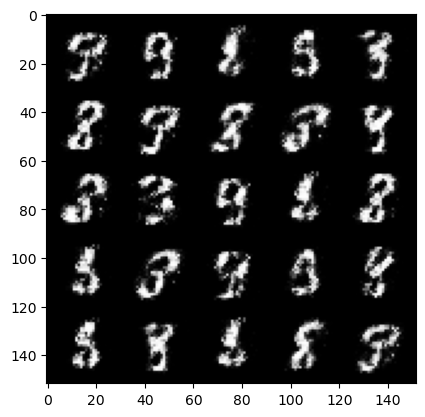

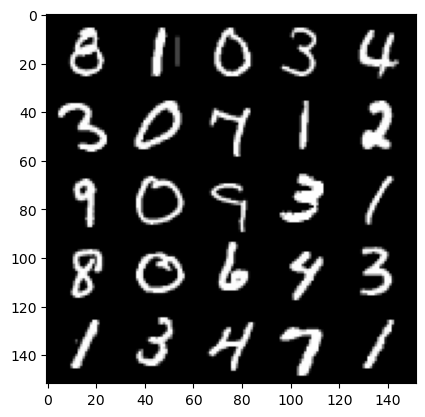

  0%|          | 0/469 [00:00<?, ?it/s]

step 20500: gen loss: 3.546445346355439, disc loss: 0.12494884048402317


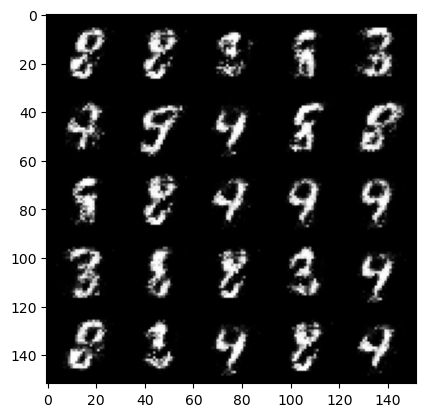

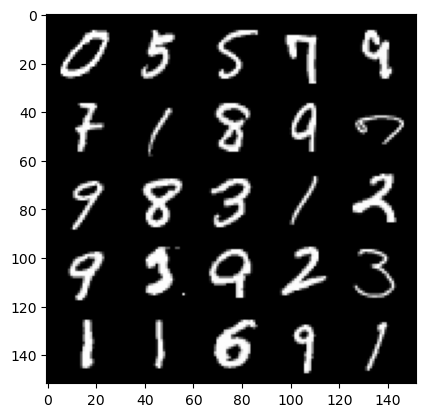

  0%|          | 0/469 [00:00<?, ?it/s]

step 21000: gen loss: 3.6720639076232917, disc loss: 0.11605016294121753


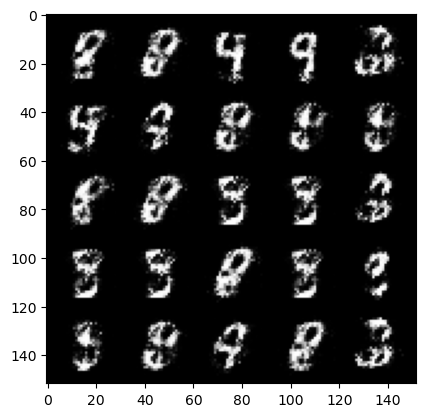

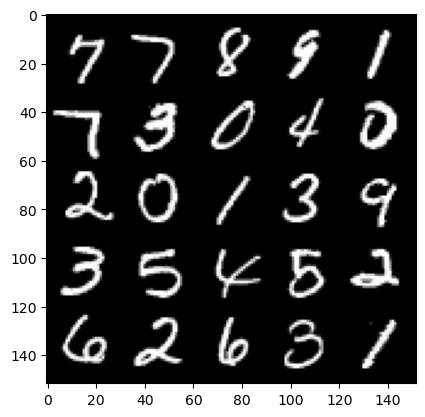

  0%|          | 0/469 [00:00<?, ?it/s]

step 21500: gen loss: 3.505462276935577, disc loss: 0.12477301473170521


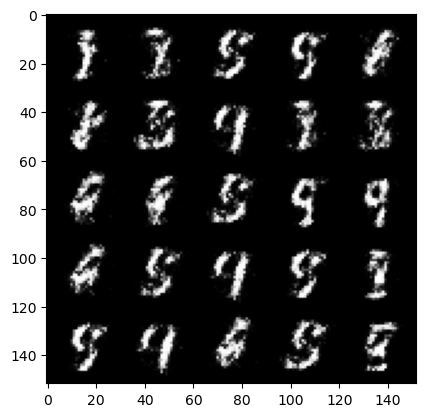

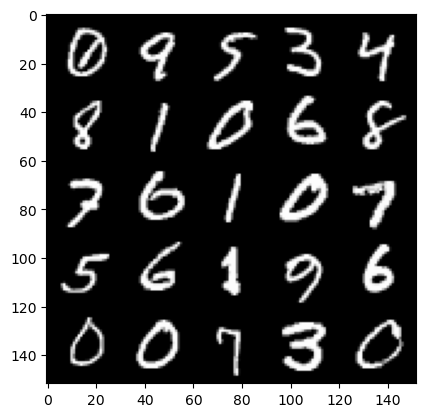

  0%|          | 0/469 [00:00<?, ?it/s]

step 22000: gen loss: 3.6379952731132525, disc loss: 0.12844236194342368


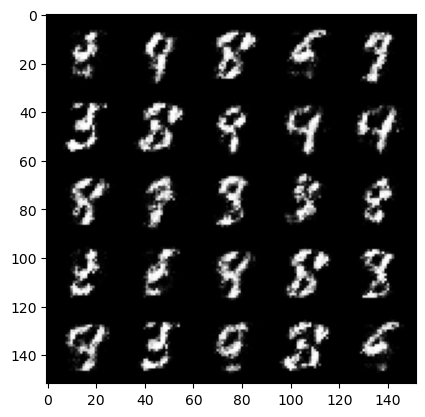

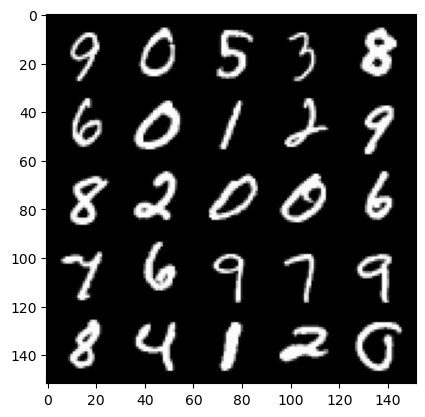

  0%|          | 0/469 [00:00<?, ?it/s]

step 22500: gen loss: 3.4754905252456667, disc loss: 0.1581782012879848


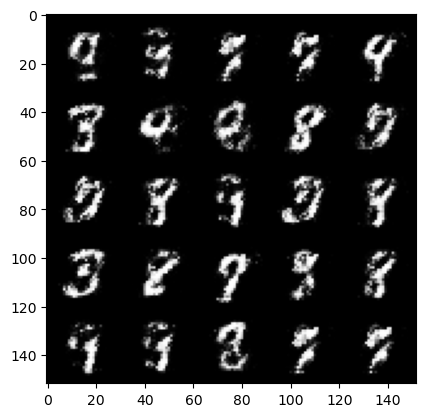

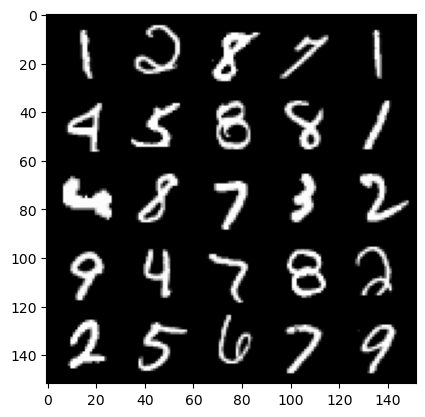

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

step 23000: gen loss: 3.4405987877845763, disc loss: 0.138811289705336


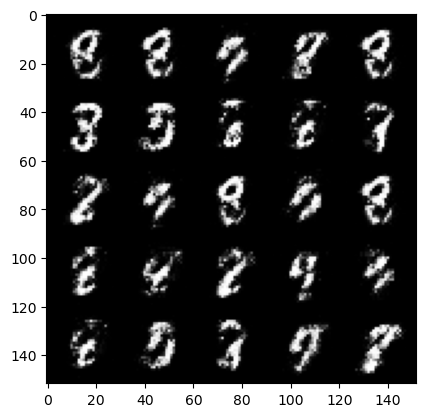

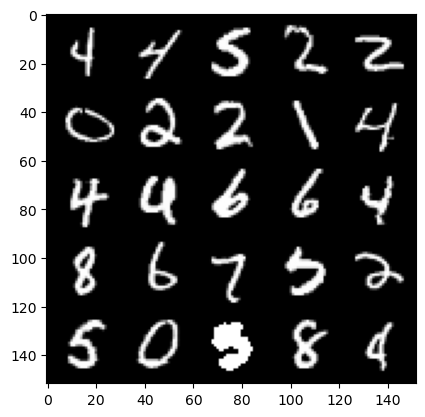

  0%|          | 0/469 [00:00<?, ?it/s]

step 23500: gen loss: 3.577191707134246, disc loss: 0.12054424706846484


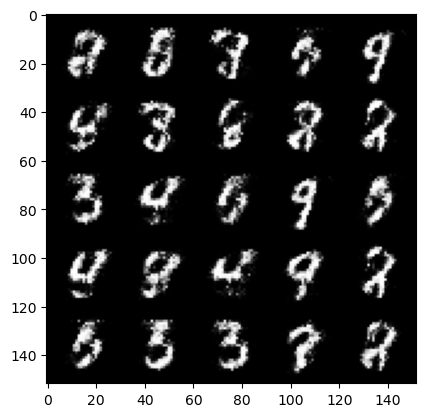

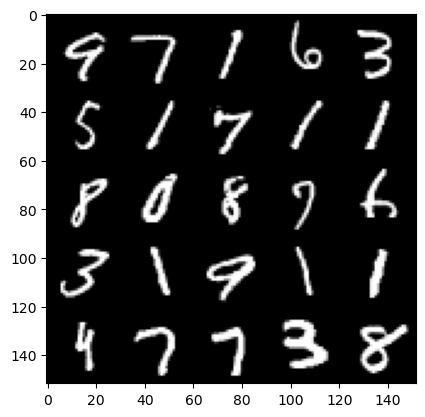

  0%|          | 0/469 [00:00<?, ?it/s]

step 24000: gen loss: 3.392766415596008, disc loss: 0.16891642278432842


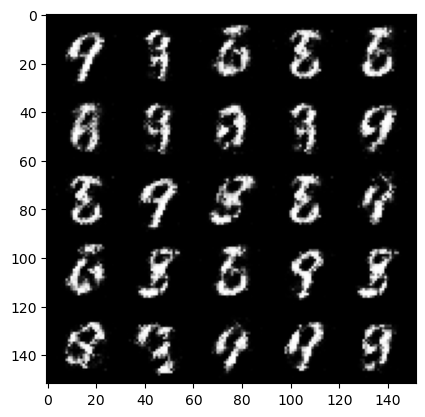

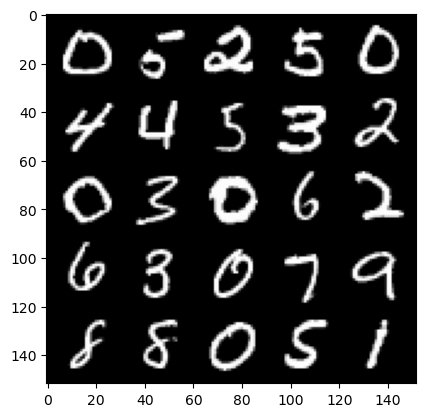

  0%|          | 0/469 [00:00<?, ?it/s]

step 24500: gen loss: 3.3027588515281683, disc loss: 0.14516296301037096


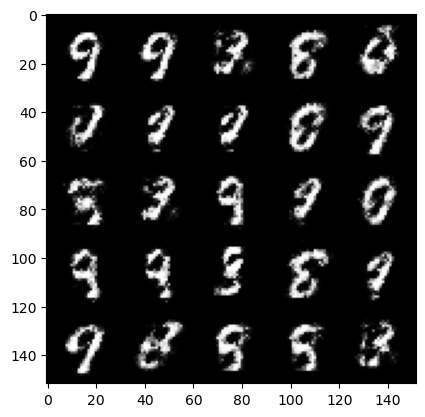

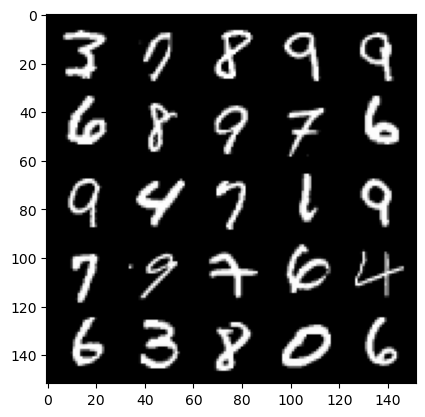

  0%|          | 0/469 [00:00<?, ?it/s]

step 25000: gen loss: 3.2706359386444093, disc loss: 0.1407104062289


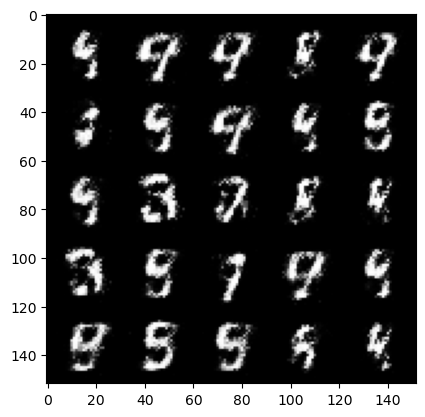

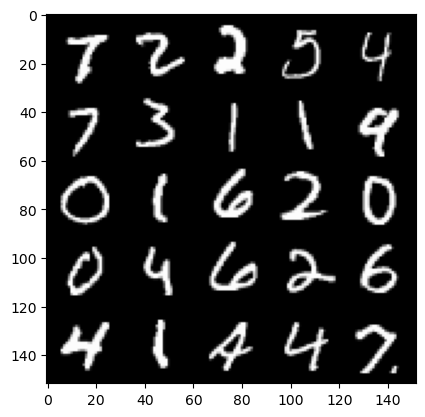

  0%|          | 0/469 [00:00<?, ?it/s]

step 25500: gen loss: 3.2673759055137648, disc loss: 0.14801670353114607


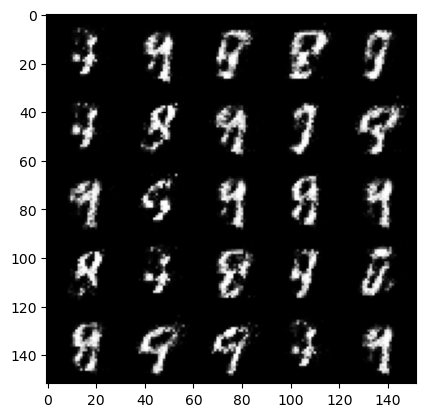

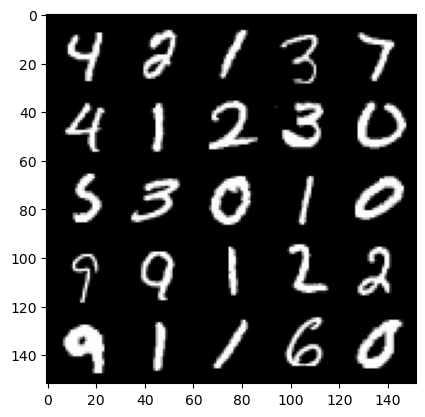

  0%|          | 0/469 [00:00<?, ?it/s]

step 26000: gen loss: 3.4886456050872843, disc loss: 0.1387395487874747


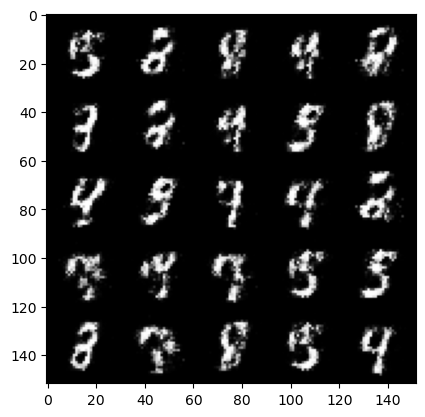

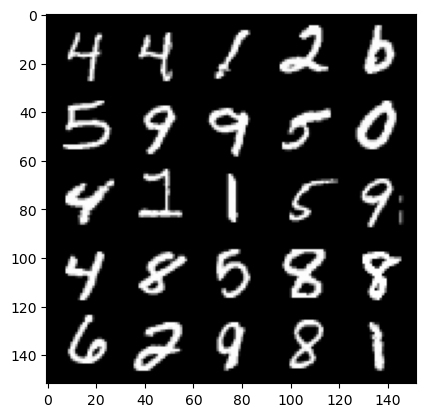

  0%|          | 0/469 [00:00<?, ?it/s]

step 26500: gen loss: 2.9863153390884416, disc loss: 0.19697916345298302


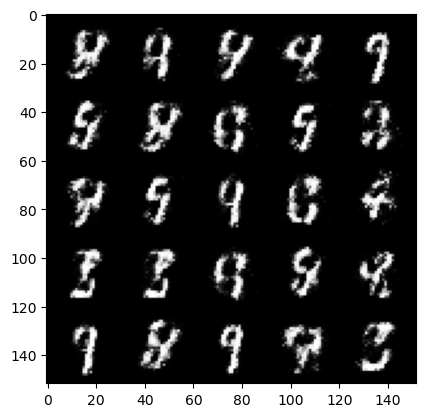

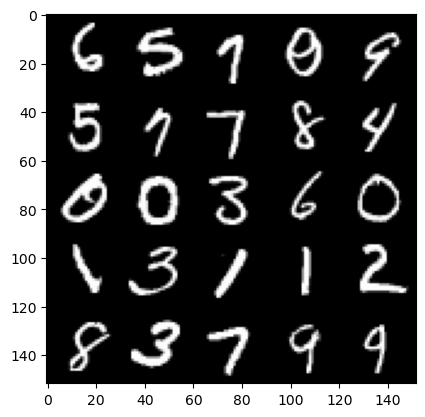

  0%|          | 0/469 [00:00<?, ?it/s]

step 27000: gen loss: 3.153469875335689, disc loss: 0.16289238423109056


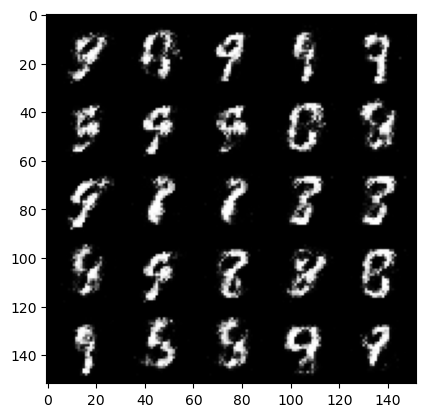

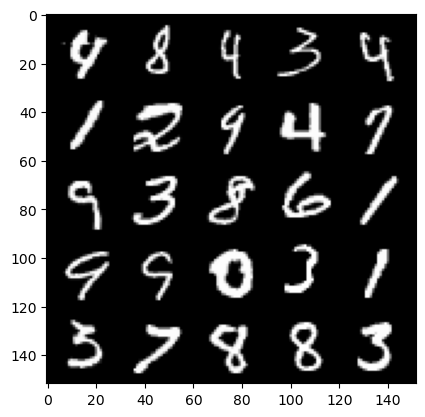

  0%|          | 0/469 [00:00<?, ?it/s]

step 27500: gen loss: 3.152013632774353, disc loss: 0.17230305926501743


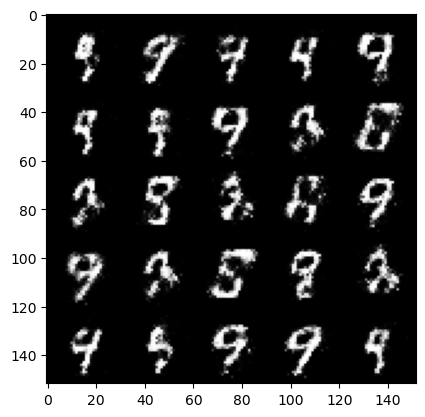

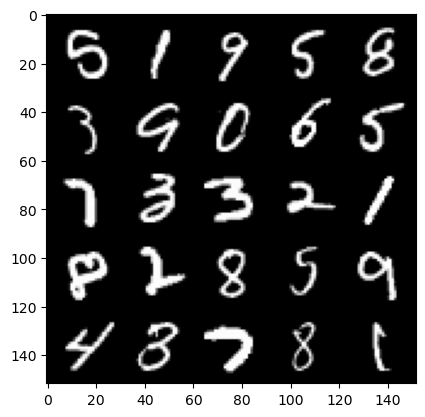

  0%|          | 0/469 [00:00<?, ?it/s]

step 28000: gen loss: 3.2492913475036644, disc loss: 0.1653475984185932


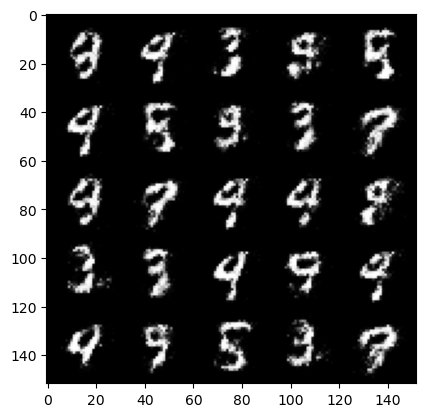

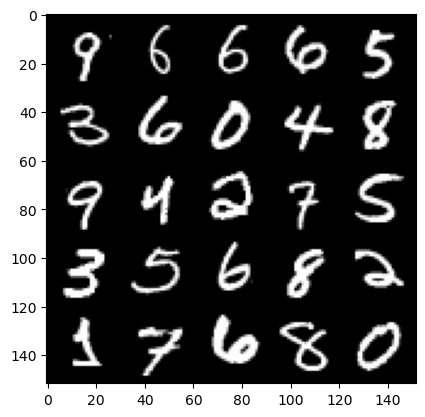

  0%|          | 0/469 [00:00<?, ?it/s]

step 28500: gen loss: 3.09166915178299, disc loss: 0.1762025323808192


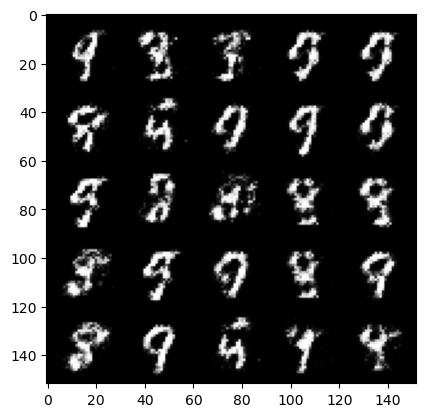

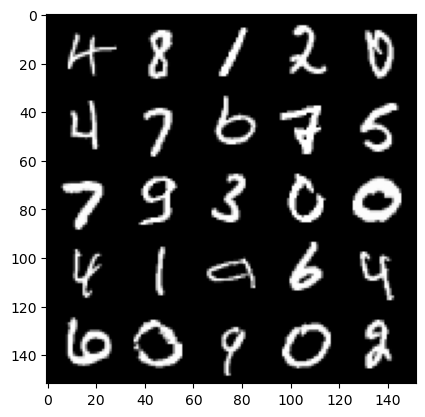

  0%|          | 0/469 [00:00<?, ?it/s]

step 29000: gen loss: 3.0881842045783983, disc loss: 0.18442777056992055


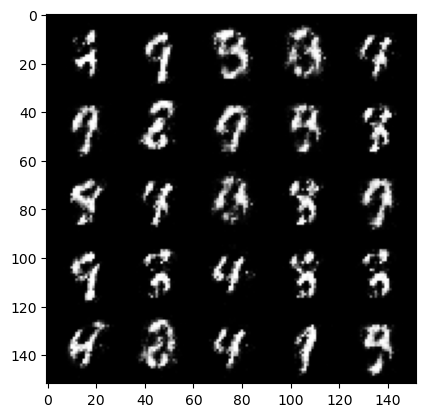

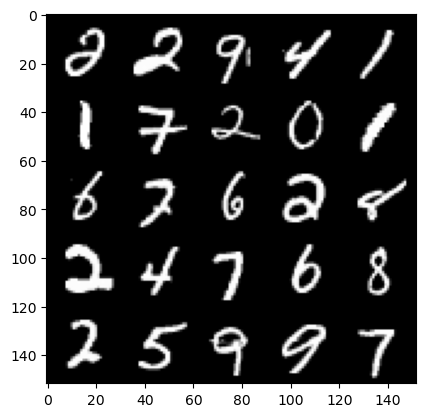

  0%|          | 0/469 [00:00<?, ?it/s]

step 29500: gen loss: 2.9701029405593875, disc loss: 0.19177918852865708


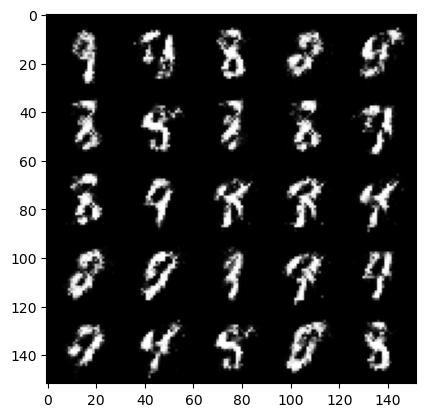

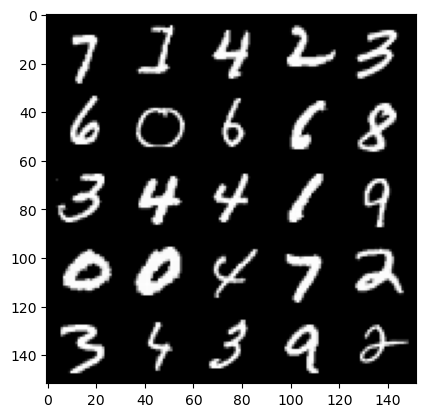

  0%|          | 0/469 [00:00<?, ?it/s]

step 30000: gen loss: 3.0859779438972437, disc loss: 0.16529619863629325


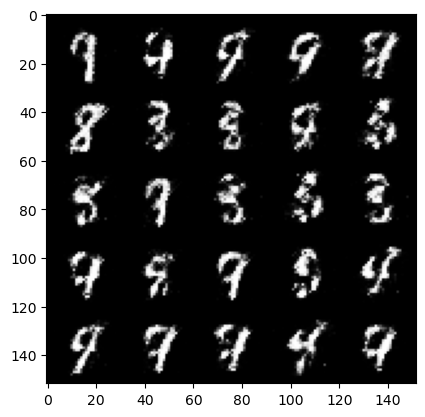

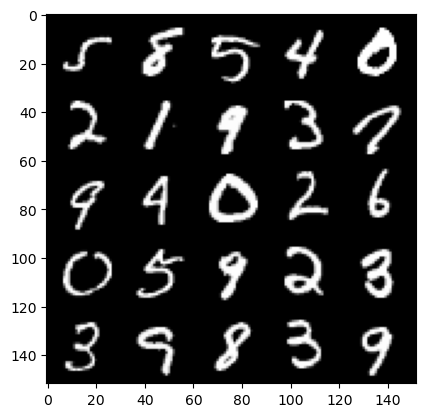

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

step 30500: gen loss: 2.951915750026702, disc loss: 0.1973699217885733


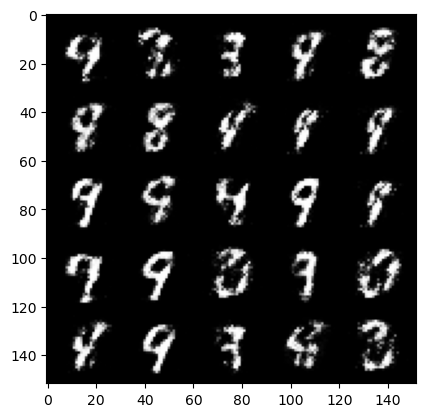

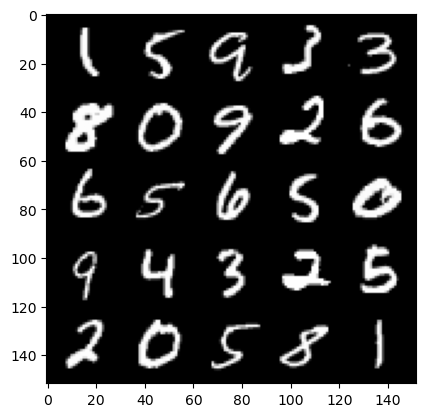

  0%|          | 0/469 [00:00<?, ?it/s]

step 31000: gen loss: 2.881199726104736, disc loss: 0.21552594202756886


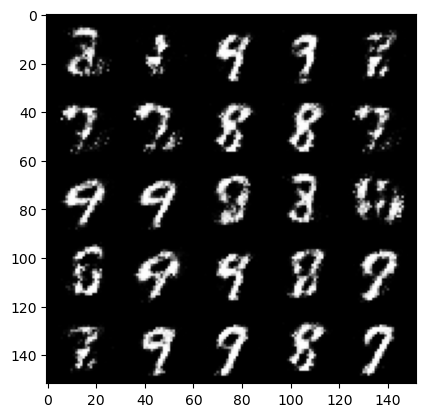

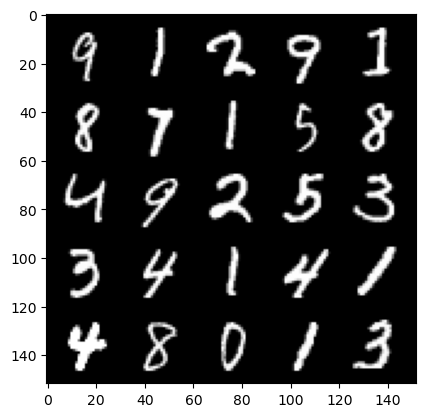

  0%|          | 0/469 [00:00<?, ?it/s]

step 31500: gen loss: 2.7021778373718304, disc loss: 0.23403540447354335


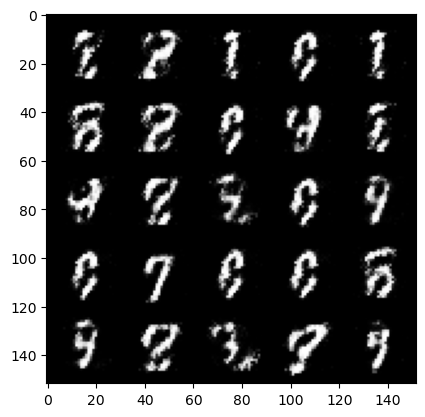

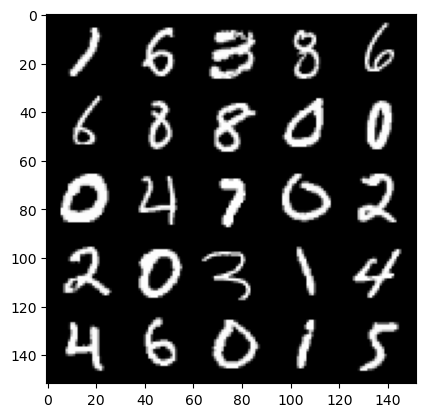

  0%|          | 0/469 [00:00<?, ?it/s]

step 32000: gen loss: 2.8353233232498165, disc loss: 0.2065615853071212


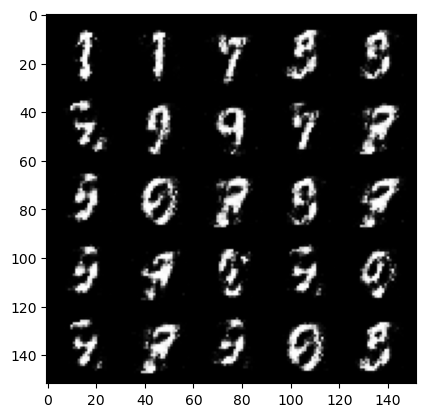

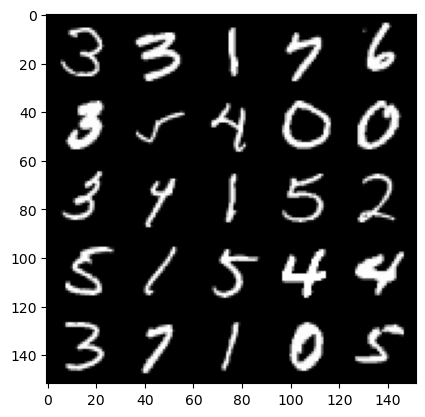

  0%|          | 0/469 [00:00<?, ?it/s]

step 32500: gen loss: 3.007267829418185, disc loss: 0.18575232271850084


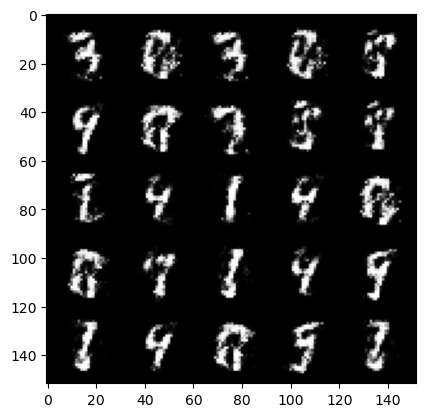

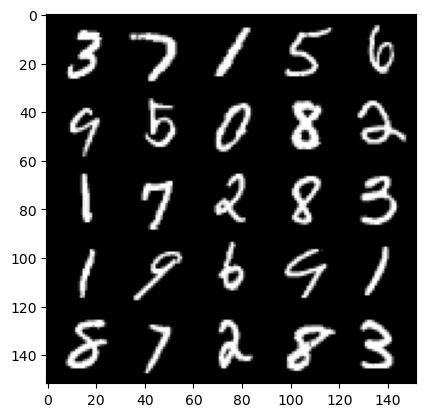

  0%|          | 0/469 [00:00<?, ?it/s]

step 33000: gen loss: 2.9727824530601485, disc loss: 0.18637414473295205


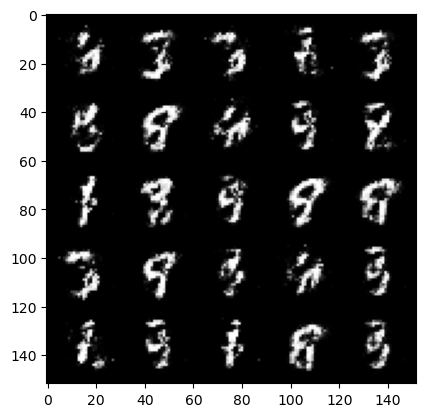

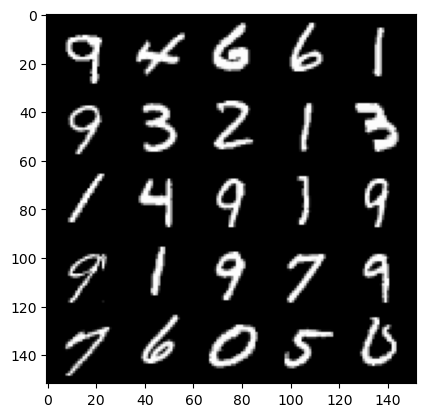

  0%|          | 0/469 [00:00<?, ?it/s]

step 33500: gen loss: 2.8676920876502963, disc loss: 0.20299072498083126


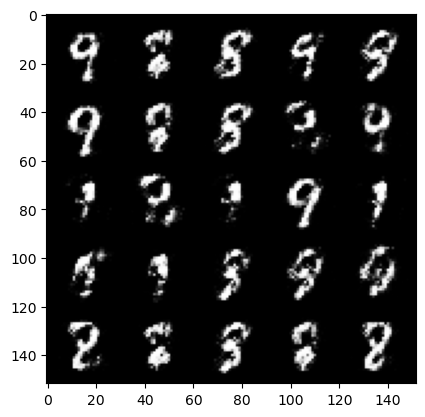

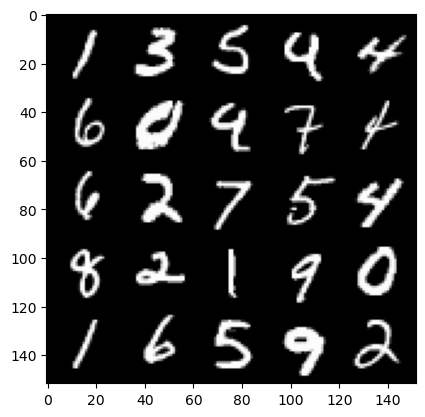

  0%|          | 0/469 [00:00<?, ?it/s]

step 34000: gen loss: 2.9174636111259478, disc loss: 0.19036652480065813


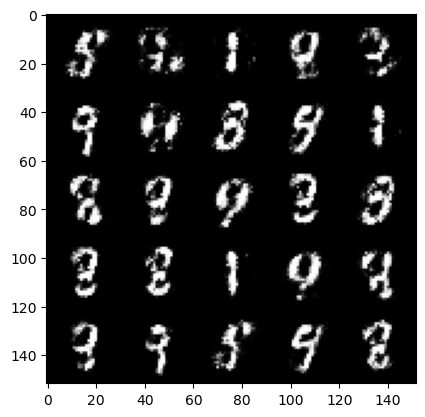

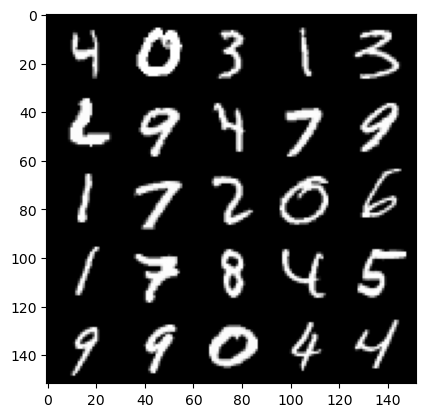

  0%|          | 0/469 [00:00<?, ?it/s]

step 34500: gen loss: 2.9376572289466862, disc loss: 0.19263837452232835


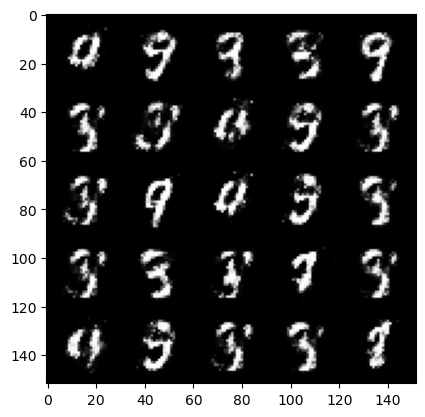

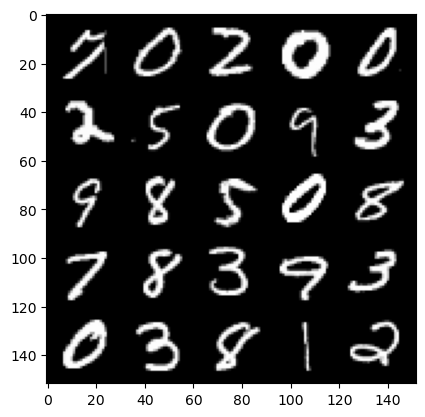

  0%|          | 0/469 [00:00<?, ?it/s]

step 35000: gen loss: 3.1845727181434627, disc loss: 0.16532112567126742


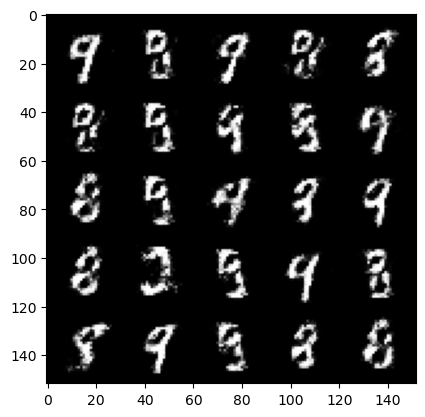

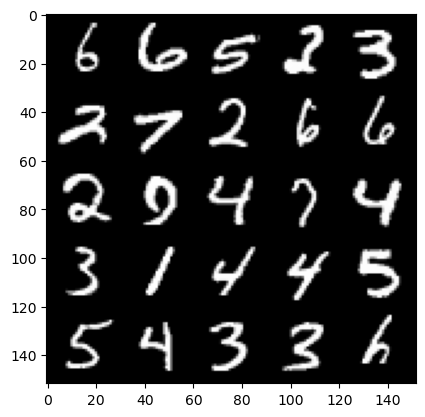

  0%|          | 0/469 [00:00<?, ?it/s]

step 35500: gen loss: 3.0955884222984307, disc loss: 0.1836416173279286


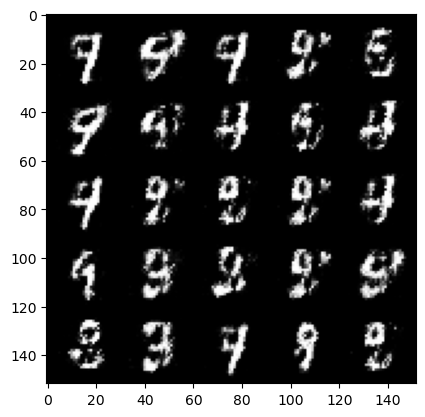

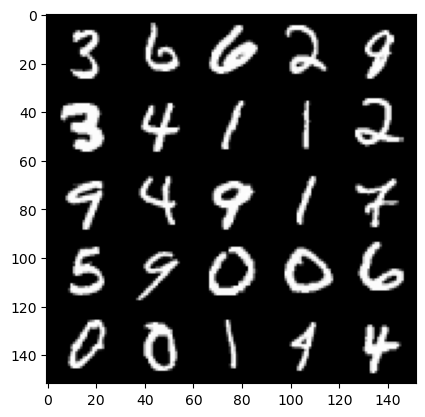

  0%|          | 0/469 [00:00<?, ?it/s]

step 36000: gen loss: 3.1056945896148656, disc loss: 0.18584305934608003


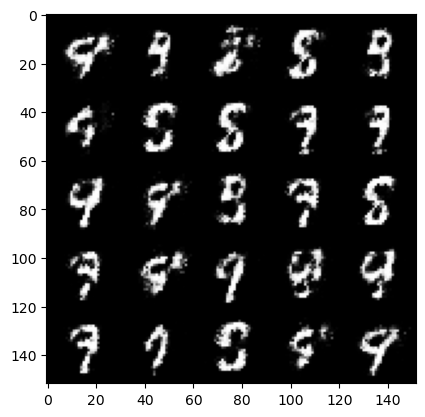

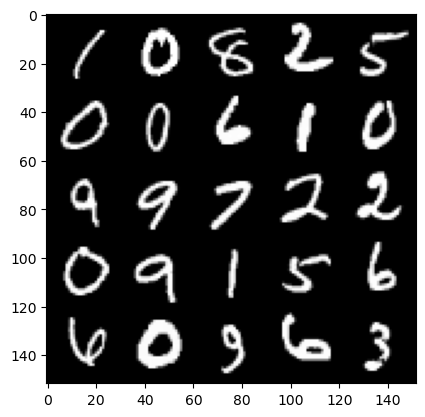

  0%|          | 0/469 [00:00<?, ?it/s]

step 36500: gen loss: 2.881645669937135, disc loss: 0.21170538739860065


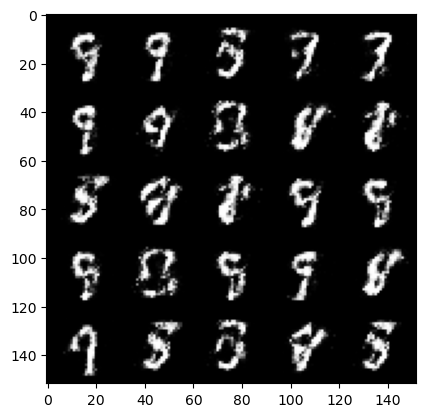

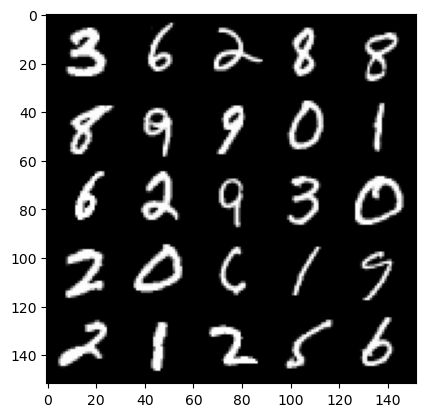

  0%|          | 0/469 [00:00<?, ?it/s]

step 37000: gen loss: 2.8379461631774894, disc loss: 0.1950438418537378


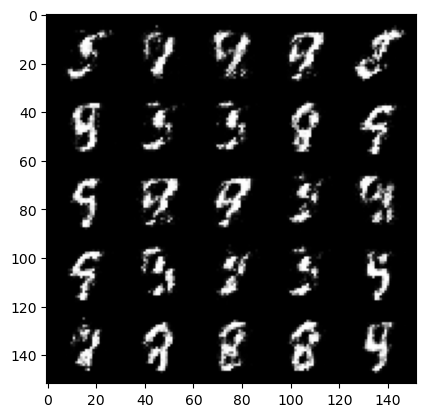

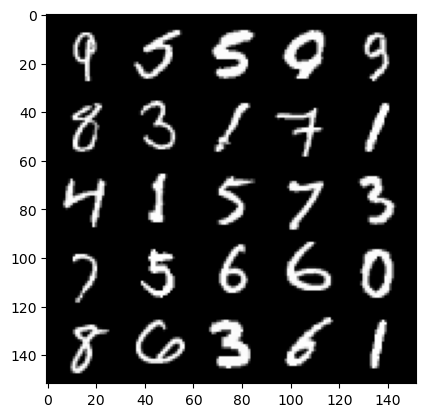

  0%|          | 0/469 [00:00<?, ?it/s]

step 37500: gen loss: 2.790319835186004, disc loss: 0.1975637556314469


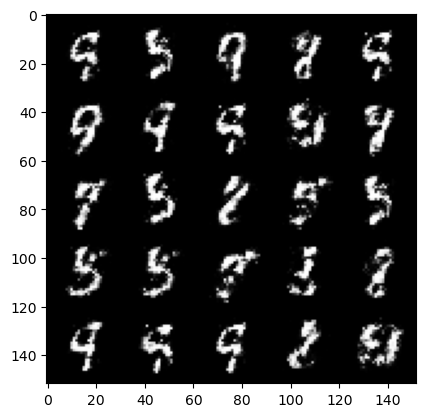

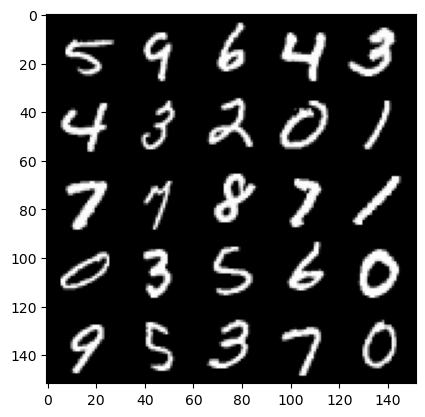

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

step 38000: gen loss: 2.828410577774047, disc loss: 0.20006255526840694


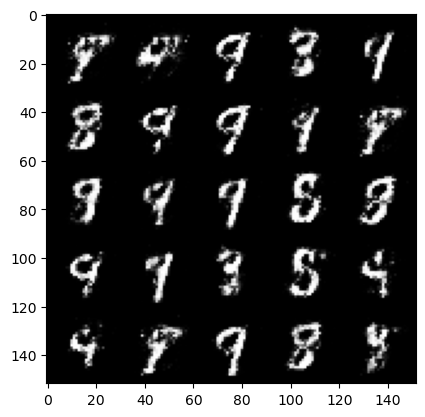

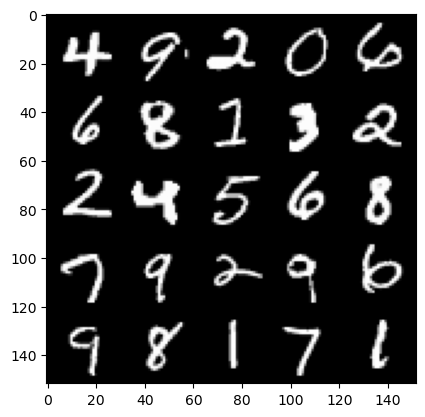

  0%|          | 0/469 [00:00<?, ?it/s]

step 38500: gen loss: 2.8852392868995658, disc loss: 0.200393080845475


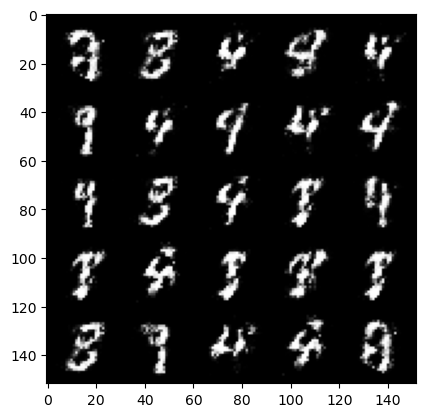

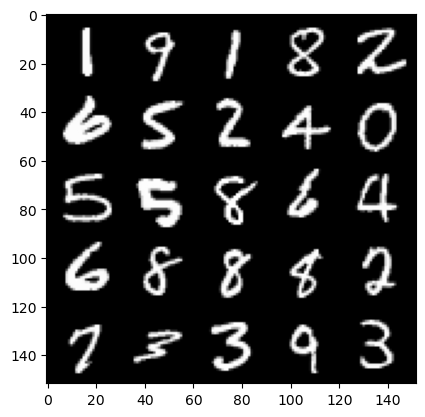

  0%|          | 0/469 [00:00<?, ?it/s]

step 39000: gen loss: 2.713561603784562, disc loss: 0.2351676490604876


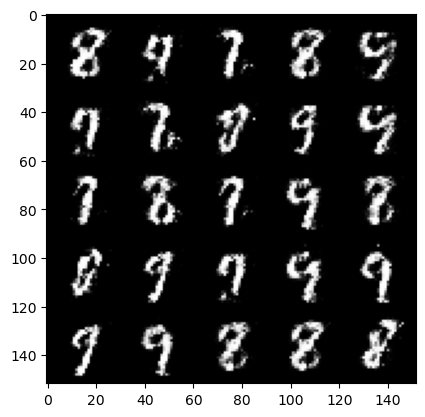

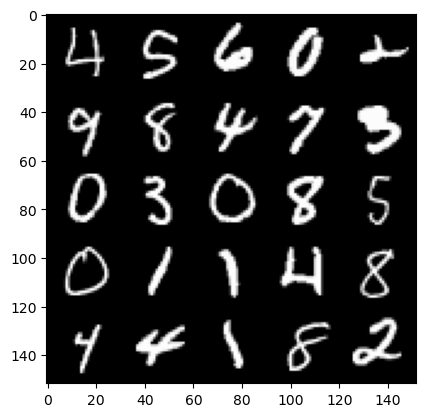

  0%|          | 0/469 [00:00<?, ?it/s]

step 39500: gen loss: 2.811494644165039, disc loss: 0.19410572329163572


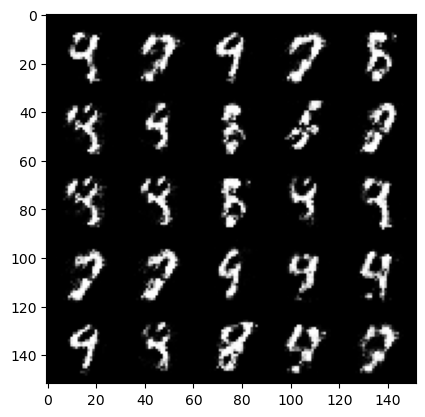

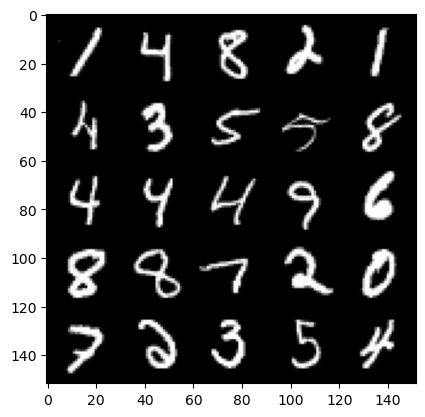

  0%|          | 0/469 [00:00<?, ?it/s]

step 40000: gen loss: 2.839178593635556, disc loss: 0.1956988089531661


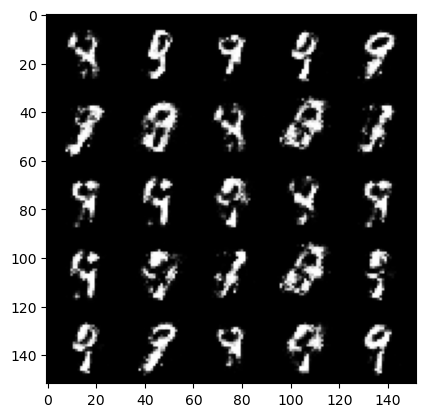

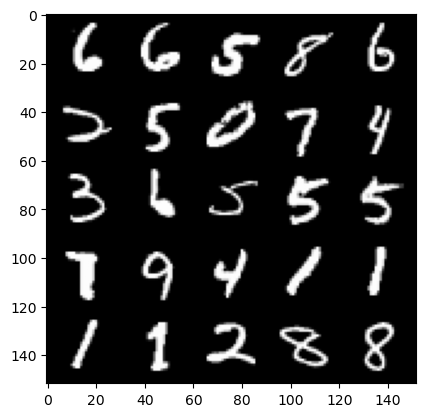

  0%|          | 0/469 [00:00<?, ?it/s]

step 40500: gen loss: 2.72937273645401, disc loss: 0.21638227613270275


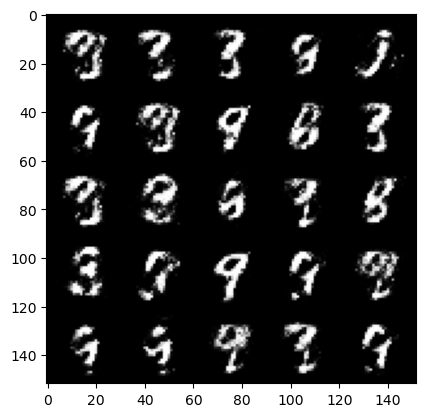

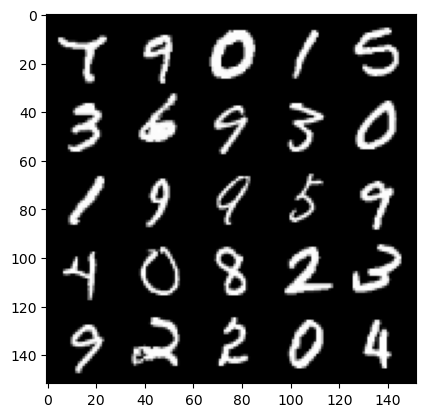

  0%|          | 0/469 [00:00<?, ?it/s]

step 41000: gen loss: 2.735541563987732, disc loss: 0.1951787048876285


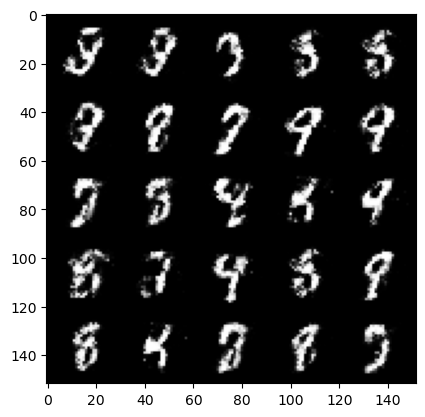

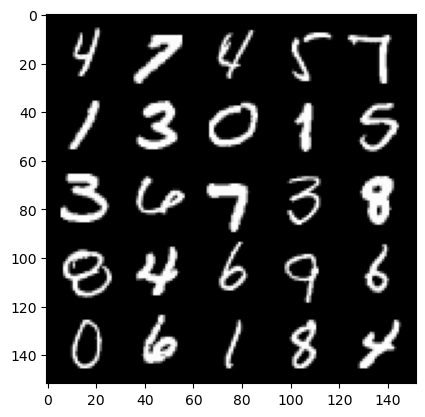

  0%|          | 0/469 [00:00<?, ?it/s]

step 41500: gen loss: 2.8500201749801612, disc loss: 0.19082019548118104


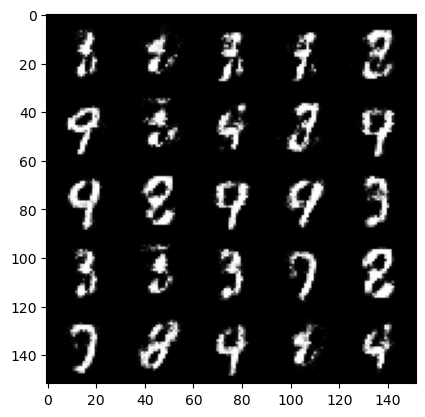

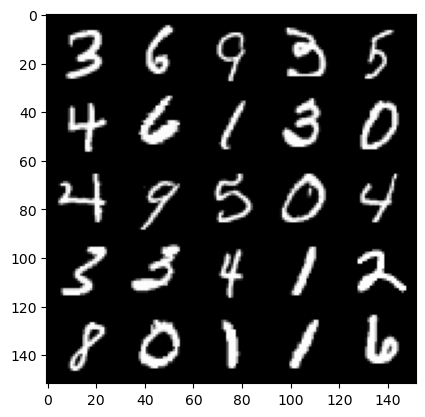

  0%|          | 0/469 [00:00<?, ?it/s]

step 42000: gen loss: 2.941141052246097, disc loss: 0.17417511048913


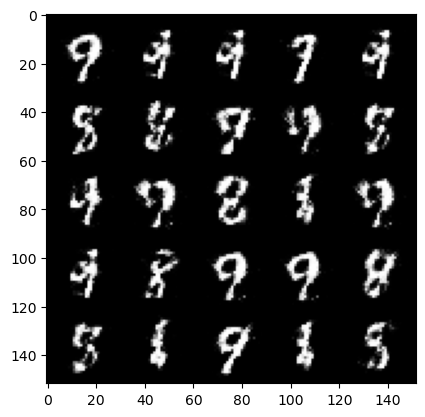

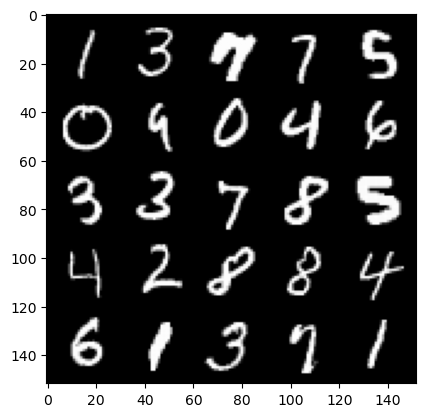

  0%|          | 0/469 [00:00<?, ?it/s]

step 42500: gen loss: 2.7360311951637266, disc loss: 0.21235941755771612


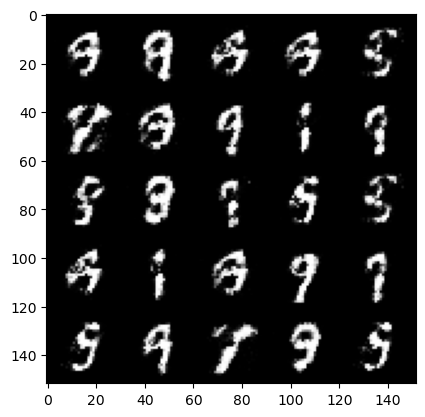

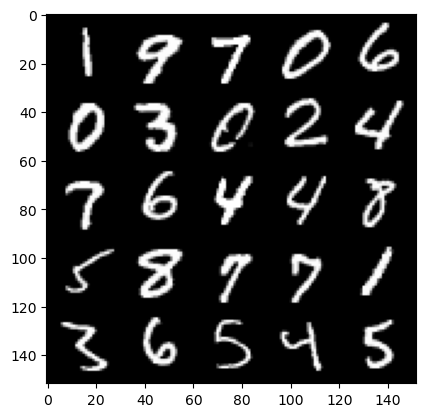

  0%|          | 0/469 [00:00<?, ?it/s]

step 43000: gen loss: 2.6950247340202327, disc loss: 0.2108231539726258


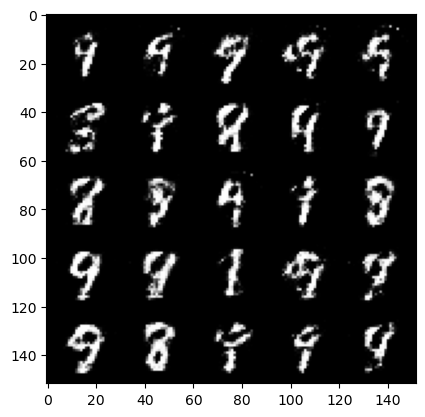

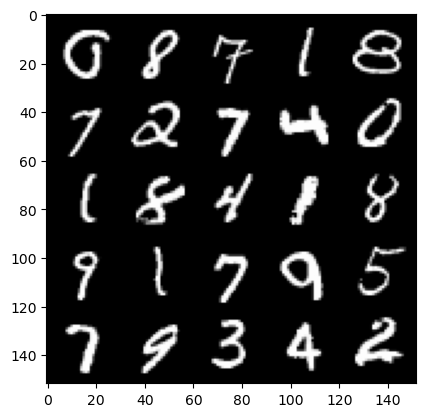

  0%|          | 0/469 [00:00<?, ?it/s]

step 43500: gen loss: 2.795380323410035, disc loss: 0.2017881132215262


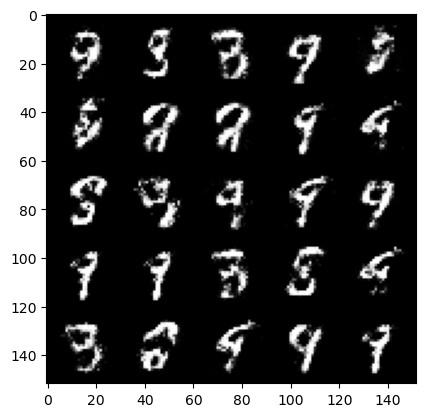

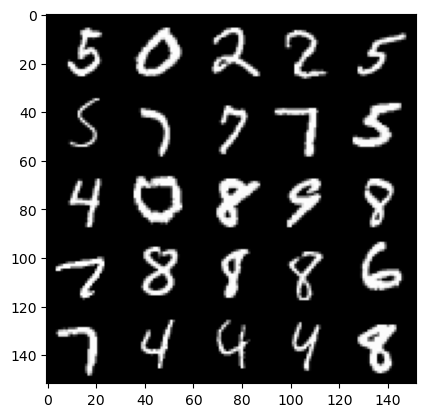

  0%|          | 0/469 [00:00<?, ?it/s]

step 44000: gen loss: 2.6535991749763497, disc loss: 0.2190100984424352


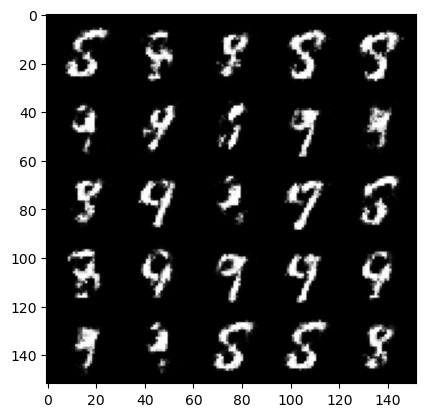

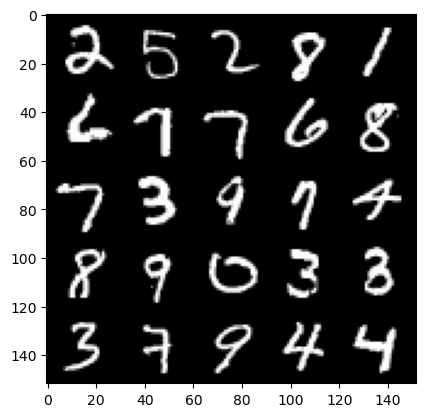

  0%|          | 0/469 [00:00<?, ?it/s]

step 44500: gen loss: 2.782804126262662, disc loss: 0.18984245510399367


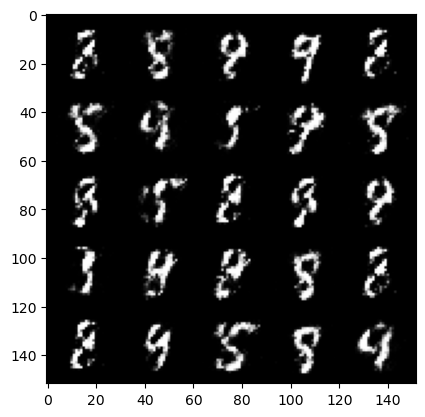

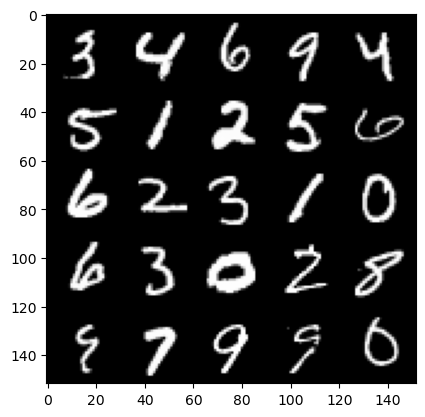

  0%|          | 0/469 [00:00<?, ?it/s]

step 45000: gen loss: 2.8594946789741535, disc loss: 0.2155418238341807


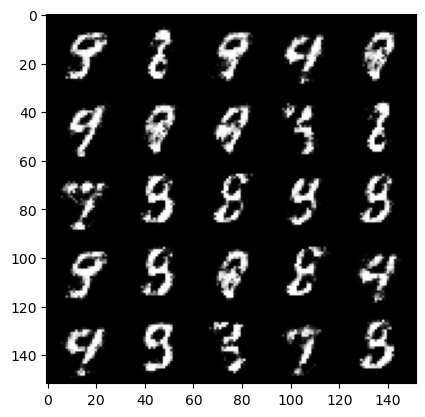

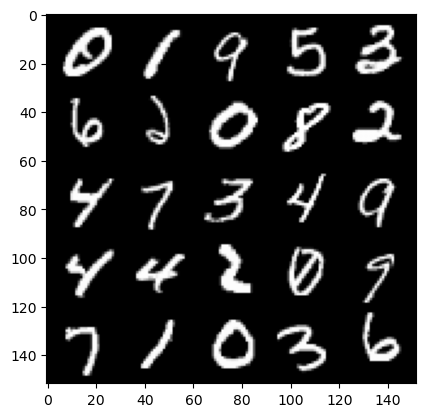

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

step 45500: gen loss: 2.6378082737922695, disc loss: 0.2324227972924709


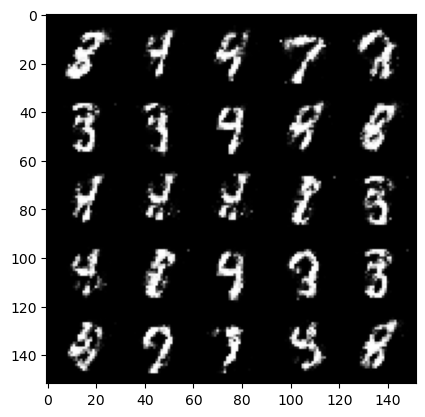

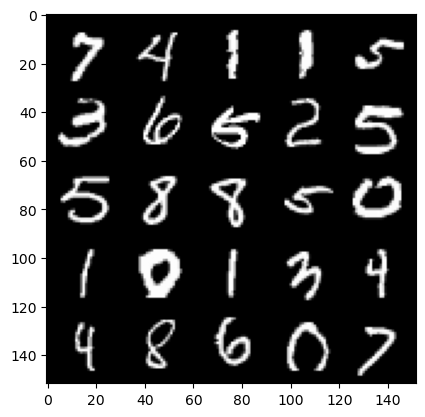

  0%|          | 0/469 [00:00<?, ?it/s]

step 46000: gen loss: 2.6092734794616708, disc loss: 0.21338209918141368


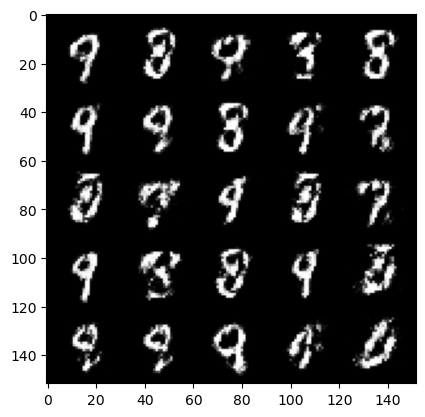

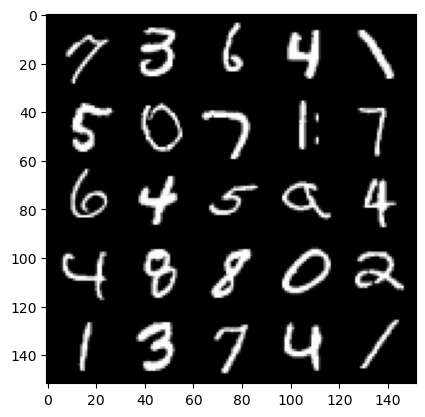

  0%|          | 0/469 [00:00<?, ?it/s]

step 46500: gen loss: 2.6644608440399193, disc loss: 0.21828566250205042


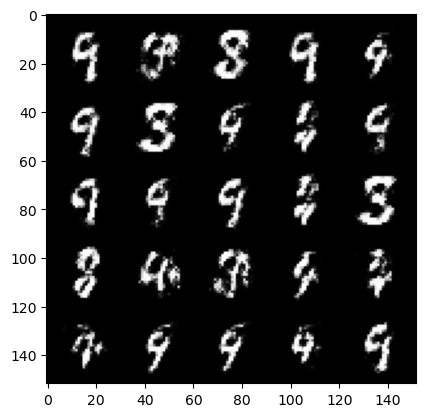

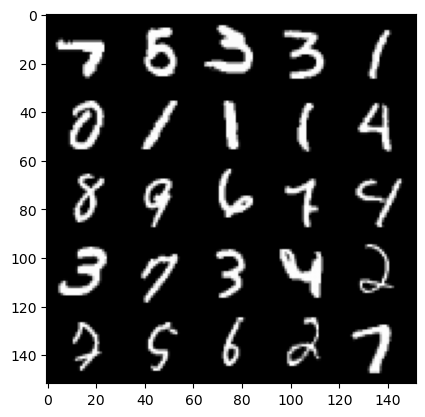

  0%|          | 0/469 [00:00<?, ?it/s]

step 47000: gen loss: 2.6607522892951962, disc loss: 0.21538834580779073


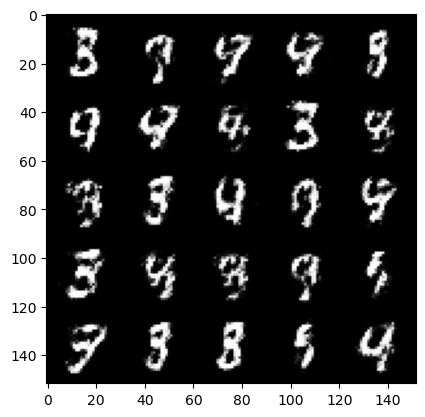

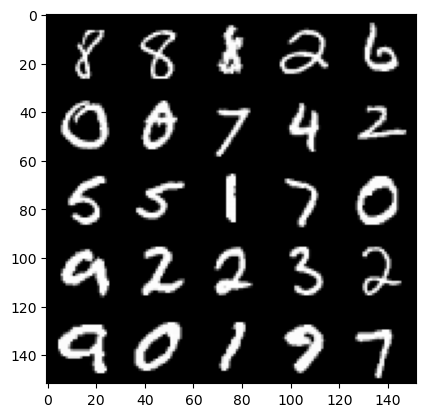

In [ ]:
cur_step = 0
mean_disc_loss = 0
mean_gen_loss = 0
for epoch in range(n_epochs):
    for real, _ in tqdm(dataloader):
        num_images = len(real)
        real = real.view(num_images, -1).to(device)
        
        # discriminator
        disc_opt.zero_grad()
        disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, noise_dim, device)
        disc_loss.backward(retain_graph=True)
        disc_opt.step()
        
        # generator
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, num_images, noise_dim, device)
        gen_loss.backward()
        gen_opt.step()
        
        # logs
        mean_disc_loss += disc_loss.item() / display_step
        mean_gen_loss += gen_loss.item() / display_step

        if cur_step % display_step == 0 and cur_step > 0:
            print(f"step {cur_step}: gen loss: {mean_gen_loss}, disc loss: {mean_disc_loss}")
            
            noise = get_noise(num_images, noise_dim, device=device)
            fake = gen(noise)
            
            show_tensor_images(fake)
            show_tensor_images(real)
            
            mean_disc_loss, mean_gen_loss =0, 0
        cur_step += 1
            
        